# The Mountain Car Problem

### The project is about solving a Markov Decision Process (MDP) using Q-learning in RL. It uses the Mountain Car problem, where the car can not drive directly uphill due to insufficient power and must build momentum by oscillating back and forth.

In [1]:
import numpy as np
import gymnasium as gym
import math
import pandas as pd
import matplotlib.pyplot as plt
import random
import os
from matplotlib.colors import ListedColormap

## 1. Creating mountain-car class

In Reinforcement Learning, we are trying to solve a problem that is framed as an MDP - a Markov Decision Process. An MDP is comprised of states $s \in S$, actions $a \in A$, a transition dynamics function $T$ mapping states $s$ and actions $a$ to follow-up states $s'$, i.e. $T:S \times A \rightarrow S$  (or $T:S \times A \times S \rightarrow R$ if the dynamics are stochastic), a reward function $r:S \times A \times S \rightarrow R$, as well as a discount factor $\gamma$ and an initial state distribution $d:S \rightarrow R$.

In the notebook, we derive one of the most well known MDPs of RL literature - the so called mountain-car environment. In it, a car needs to drive up a mountain to a specified goal location, however the engine is not strong enough to simply drive it up directly - instead, the car needs to build up momentum by going forward and backward alternatingly until it can drive up the hill. See the image below to get in idea of the environment.

The specifications to note about representing the mountain-car MDP:

- The state is 2-dimensional and consists of x-axis position of the car as well as its velocity. Limits are $[-1.2, 0.6]$ for the position and $[-0.07, 0.07]$ for the velocity.
- The action is 1-dimensional and represents the force applied to the car. Actions in this work are discret $\{-1, 0, 1\}$.
- The reward is $100$ if the car reached the goal, i.e. its position is $\ge 0.45$ along the x-axis. For every timestep, a penalty of $0.1 * \mathrm{action}^2$ is also applied
- The car starts in the valley between the mountains at a location drawn uniformly at random between $-0.6$ & $-0.4$ and
$\gamma = 1$.
- The dynamics are given by the following equations:
$$\dot{x}_{t+1} = \dot{x}_t + a_t * \mathrm{power} - 0.0025 * \mathrm{cos}(3 * x_t)$$
$$x_{t+1} = x_t + \dot{x}_{t+1}$$
(where $a_t$ is the current action, $x_t$ the current position, $\dot{x}_t$ the current velocity, and $\mathrm{power}=0.0015$)
- The episode terminates if the the car reaches the goal or timestep 200 is reached

In [17]:
class Discrete:
    """Mimics gym.spaces.Discrete"""
    def __init__(self, n):
        self.n = n

class Box:
    """Mimics gym.spaces.Box for continuous observation spaces"""
    def __init__(self, low, high, shape, dtype=np.float32):
        self.low = low
        self.high = high
        self.shape = shape
        self.dtype = dtype

class MountainCar:
    def __init__(self):
        self.min_pos = -1.2        # Minimum allowed position of the car
        self.max_pos = 0.6         # Maximum allowed position of the car
        self.min_v = -0.07         # Minimum velocity (backward)
        self.max_v = 0.07          # Maximum velocity (forward)
        self.power = 0.0015        # Engine power constant (affects acceleration)
        self.goal_pos = 0.45       # Position at which the episode ends (goal reached)

        # Define discrete actions: 0=left, 1=no_push, 2=right
        self.min_action_val = -1.0 # Force value for action 0 (full throttle left)
        self.max_action_val = 1.0  # Force value for action 2 (full throttle right)
        self.num_actions = 3       # Number of discrete actions (0, 1, 2)

        self.timestamp = 0         # Step counter (keeps track of number of steps)
        self.state = None          # Current state (position, velocity)

        # --- Add Gym-like attributes ---
        # Observation Space: Box([pos_low, vel_low], [pos_high, vel_high])
        self.observation_space = Box(
            low=np.array([self.min_pos, self.min_v], dtype=np.float32),
            high=np.array([self.max_pos, self.max_v], dtype=np.float32),
            shape=(2,), # 2 features: position and velocity
            dtype=np.float32
        )
        # Action Space: Discrete(3) for 0, 1, 2 (left, no_push, right)
        self.action_space = Discrete(self.num_actions)


    def reset(self, seed=None, options=None):
        """
        Resets the environment and returns the initial state.
        Mimics gym.Env.reset() returning (observation, info).
        """
        seed_seq = np.random.SeedSequence(seed)
        self.rng = np.random.Generator(np.random.PCG64(seed_seq)) # using rng for sampling
        pos = self.rng.uniform(-0.6, -0.4) # Start in a random position close to the valley
        v = 0.0
        self.state = np.array([pos, v], dtype=np.float32) # Set state to position and velocity
        self.timestamp = 0 # Reset timestamp for new episode
        return self.state, {} # Return initial state and an empty info dictionary


    def step(self, action: int):
        """
        Performs a single environment step given a discrete action.
        Mimics gym.Env.step() returning (observation, reward, terminated, truncated, info).
        """
        pos, v = self.state

        # Map discrete action to a continuous force
        # 0: push left (e.g., -1.0), 1: no push (0.0), 2: push right (e.g., 1.0)
        force = 0.0
        if action == 0: # Push left
            force = self.min_action_val
        elif action == 2: # Push right
            force = self.max_action_val
        # If action == 1 (no push), force remains 0.0

        v = v + (force * self.power) - 0.0025 * np.cos(3 * pos)
        v = np.clip(v, self.min_v, self.max_v)
        pos = pos + v
        pos = np.clip(pos, self.min_pos, self.max_pos)

        # If car hits the left boundary and velocity is negative, set velocity to 0
        if pos == self.min_pos and v < 0:
            v = 0.0

        self.timestamp += 1 # Increment step counter

        # Check for termination conditions
        terminated = bool(pos >= self.goal_pos) # True if goal reached
        truncated = bool(self.timestamp >= 00) # True if max steps reached

        reward = -1.0 # Default reward for each step in MountainCar is -1
        if terminated:
            reward = 100.0 # Large positive reward for reaching the goal

        # Penalize for using power (actions 0 or 2)
        reward = reward - 0.1 * np.power(force, 2)


        self.state = np.array([pos, v], dtype=np.float32)

        # Gym's step method returns (observation, reward, terminated, truncated, info)
        return self.state, reward, terminated, truncated, {} # Return current state, reward, done flags, and info

### 1.1 Testing the environment

We can check created MountainCar environment by seeding it (with 123) and comparing it to the gymnasium implementation (that is seeded to the same random seed) on the provided action sequence (should yield the same state and reward sequence).

In [16]:
from gymnasium.envs.classic_control import MountainCarEnv

# Instantiate environments
env_custom = MountainCar()
env_gym = gym.make('MountainCar-v0')

# Compare action space
print("=== ACTION SPACE ===")
print(f"Custom: n = {env_custom.action_space.n}")
print(f"Gym:    n = {env_gym.action_space.n}")
print()

# Compare observation space
print("=== OBSERVATION SPACE ===")
print(f"Custom: low  = {env_custom.observation_space.low}, high = {env_custom.observation_space.high}")
print(f"Gym:    low  = {env_gym.observation_space.low}, high = {env_gym.observation_space.high}")
print()

# Reset both environments with the same seed
seed = 123
obs_custom, _ = env_custom.reset(seed=seed)
obs_gym, _ = env_gym.reset(seed=seed)

print("=== RESET COMPARISON ===")
print(f"Custom initial state: {obs_custom}")
print(f"Gym    initial state: {obs_gym}")
print()

# Choose same action for comparison
action = 2  # e.g. push right

next_custom, r_c, term_c, trunc_c, _ = env_custom.step(action)
next_gym, r_g, term_g, trunc_g, _ = env_gym.step(action)

print("=== STEP COMPARISON (Action = 2) ===")
print(f"Custom -> next: {next_custom}, reward: {r_c}, terminated: {term_c}, truncated: {trunc_c}")
print(f"Gym    -> next: {next_gym}, reward: {r_g}, terminated: {term_g}, truncated: {trunc_g}")
print()

# Check multiple steps
print("=== MULTI-STEP TRANSITION COMPARISON ===")
env_custom.reset(seed=seed)
env_gym.reset(seed=seed)
for i in range(3):
    action = np.random.choice(3)
    next_c, r_c, done_c, _, _ = env_custom.step(action)
    next_g, r_g, done_g, _, _ = env_gym.step(action)
    print(f"[Step {i}] Action: {action}")
    print(f"  Custom -> next: {next_c}, reward: {r_c}, done: {done_c}")
    print(f"  Gym    -> next: {next_g}, reward: {r_g}, done: {done_g}")
    print()
    if done_c or done_g:
        break

=== ACTION SPACE ===
Custom: n = 3
Gym:    n = 3

=== OBSERVATION SPACE ===
Custom: low  = [-1.2  -0.07], high = [0.6  0.07]
Gym:    low  = [-1.2  -0.07], high = [0.6  0.07]

=== RESET COMPARISON ===
Custom initial state: [-0.46352962  0.        ]
Gym    initial state: [-0.46352962  0.        ]

=== STEP COMPARISON (Action = 2) ===
Custom -> next: [-0.4624777   0.00105192], reward: -1.1, terminated: False, truncated: False
Gym    -> next: [-0.4629777   0.00055192], reward: -1.0, terminated: False, truncated: False

=== MULTI-STEP TRANSITION COMPARISON ===
[Step 0] Action: 1
  Custom -> next: [-4.6397769e-01 -4.4808423e-04], reward: -1.0, done: False
  Gym    -> next: [-4.6397772e-01 -4.4808415e-04], reward: -1.0, done: False

[Step 1] Action: 0
  Custom -> next: [-0.46487054 -0.00089286], reward: -1.0, done: False
  Gym    -> next: [-0.46587056 -0.00189286], reward: -1.0, done: False

[Step 2] Action: 2
  Custom -> next: [-4.6470159e-01  1.6895153e-04], reward: -1.1, done: False
  Gym 

In [11]:
class QAgent:
    def __init__(self, env):
        # Accept either a Gym environment string or a custom env object
        if isinstance(env, str):
            self.env = gym.make(env)
            self.env_name = env
        else:
            self.env = env
            self.env_name = "CustomEnv"

        # Reset and get initial state
        reset_result = self.env.reset()
        self.state = reset_result[0] if isinstance(reset_result, tuple) else reset_result

        # Extract dimensions
        self.observation_space_size = len(self.state)
        self.actions = self.env.action_space.n

        self.observation_space_low = self.env.observation_space.low
        self.observation_space_high = self.env.observation_space.high

        # Q-table settings
        self.discrete_sizes = [25] * self.observation_space_size
        self.q_table = np.random.uniform(low=-2, high=0, size=(*self.discrete_sizes, self.actions))

        # Hyperparameters
        self.alpha = 0.1
        self.gamma = 0.95
        self.epsilon = 1.0
        self.num_train_episodes = 15000
        self.num_episodes_decay = 12000
        self.epsilon_decay = self.epsilon / self.num_episodes_decay

        # Logging
        self.rewards = []
        
        # Statistics tracking
        self.aggr_ep_rewards = {'ep': [], 'avg': [], 'max': [], 'min': []}
        self.stats_every = 1000  # Change to any frequency you prefer

    def get_state_index(self, state):
        # Convert continuous state to discrete indices
        state_idx = []
        for i in range(self.observation_space_size):
            ratio = (state[i] - self.observation_space_low[i]) / (self.observation_space_high[i] - self.observation_space_low[i])
            idx = int(ratio * self.discrete_sizes[i])
            idx = min(self.discrete_sizes[i] - 1, max(0, idx))  # clip
            state_idx.append(idx)
        return tuple(state_idx)

    def update(self, state, action, reward, next_state, is_terminal):
        state_idx = self.get_state_index(state)
        next_state_idx = self.get_state_index(next_state)

        if is_terminal:
            self.q_table[state_idx][action] = reward
        else:
            max_future_q = np.max(self.q_table[next_state_idx])
            current_q = self.q_table[state_idx][action]
            new_q = current_q + self.alpha * (reward + self.gamma * max_future_q - current_q)
            self.q_table[state_idx][action] = new_q

    def get_action(self):
        if np.random.rand() < self.epsilon:
            return np.random.randint(self.actions)
        else:
            state_idx = self.get_state_index(self.state)
            return np.argmax(self.q_table[state_idx])

    def env_step(self):
        action = self.get_action()
        next_state, reward, terminated, truncated, _ = self.env.step(action)
        done = terminated or truncated

        self.update(self.state, action, reward, next_state, terminated and not truncated)
        self.state = next_state

        return done, reward

    def train(self, eval_intervals=1000, save_interval=5000, plot_interval=1000):
        for episode in range(1, self.num_train_episodes + 1):
            done = False
            episode_reward = 0

            while not done:
                done, reward = self.env_step()
                episode_reward += reward

            self.rewards.append(episode_reward)
            self.state = self.env.reset()[0] if isinstance(self.env.reset(), tuple) else self.env.reset()

            self.epsilon = max(0, self.epsilon - self.epsilon_decay)
            
            # === Stats Logging ===
            if episode % self.stats_every == 0:
                avg = np.mean(self.rewards[-self.stats_every:])
                mx = np.max(self.rewards[-self.stats_every:])
                mn = np.min(self.rewards[-self.stats_every:])
                self.aggr_ep_rewards['ep'].append(episode)
                self.aggr_ep_rewards['avg'].append(avg)
                self.aggr_ep_rewards['max'].append(mx)
                self.aggr_ep_rewards['min'].append(mn)
                print(f"[Episode {episode}] avg: {avg:.2f}, max: {mx}, min: {mn}, epsilon: {self.epsilon:.4f}")

            if episode % save_interval == 0:
                self.save_q_table(f'q_table_episode_{episode}.npy')

            if episode % plot_interval == 0:
                self.plot_rewards(interval=plot_interval)
                self.save_q_table_heatmaps(episode)
                self.save_policy_map(episode)
                
    def save_q_table(self, filename):
        if not os.path.exists('q_tables'):
            os.makedirs('q_tables')
        filepath = os.path.join('q_tables', filename)
        np.save(filepath, self.q_table)
        print(f"Q-table saved to {filepath}")

    def plot_rewards(self, interval=100):
        plt.figure(figsize=(12, 6))
        plt.plot(self.rewards)
        plt.xlabel('Episode', fontsize=16)
        plt.ylabel('Total Reward', fontsize=16)
        plt.title('Rewards over Episodes', fontsize=20)
        plt.tight_layout()
        plt.savefig(f'rewards_plot_{len(self.rewards)//interval * interval}.png')
        plt.show()

    def agent_eval(self):
        print("Evaluation started (no render for custom env)")
        eval_env = self.env if self.env_name == "CustomEnv" else gym.make(self.env_name, render_mode="human")
        done = False
        eval_state = eval_env.reset()[0] if isinstance(eval_env.reset(), tuple) else eval_env.reset()
        total_reward = 0

        while not done:
            state_idx = self.get_state_index(eval_state)
            action = np.argmax(self.q_table[state_idx])
            eval_state, reward, terminated, truncated, _ = eval_env.step(action)
            done = terminated or truncated
            total_reward += reward

        print(f"Evaluation reward: {total_reward:.2f}")

    
    def save_q_table_heatmaps(self, episode, save_dir='q_heatmaps', show_inline=True, annotate=True):
        os.makedirs(save_dir, exist_ok=True)
        fig, axes = plt.subplots(self.actions, 1, figsize=(15, 5 * self.actions))
        
        for action in range(self.actions):
            ax = axes[action] if self.actions > 1 else axes
            q_vals = self.q_table[:, :, action]
            im = ax.imshow(q_vals, aspect='auto', cmap='viridis')
            ax.set_title(f"Q-values for Action {action}", fontsize=20)
            ax.set_ylabel("Position Index", fontsize=16)
            ax.set_xlabel("Velocity Index", fontsize=16)
            ax.invert_yaxis()
            
            if annotate:
                for i in range(q_vals.shape[0]):
                    for j in range(q_vals.shape[1]):
                        val = f"{q_vals[i, j]:.2f}"
                        ax.text(j, i, val, ha='center', va='center', color='white', fontsize=6)

            fig.colorbar(im, ax=ax, label='Q-value')

        plt.tight_layout()
        save_path = os.path.join(save_dir, f"q_heatmap_ep_{episode}.png")
        plt.savefig(save_path)
        
        if show_inline:
            plt.show()
        else:
            plt.close()


    def save_policy_map(self, episode, save_dir='policy_maps', show_inline=True):
        os.makedirs(save_dir, exist_ok=True)
        policy = np.argmax(self.q_table, axis=2)
        cmap = ListedColormap(['red', 'blue', 'green'])
        
        plt.figure(figsize=(8, 6))
        plt.title(f"Policy Map at Episode {episode}", fontsize=20)
        im = plt.imshow(policy, aspect='auto', cmap=cmap, vmin=0, vmax=self.actions - 1)
        plt.colorbar(im, ticks=range(self.actions), label='Action')
        plt.ylabel("Position Index", fontsize=16)
        plt.xlabel("Velocity Index", fontsize=16)
        plt.gca().invert_yaxis()
        plt.tight_layout()
        
        save_path = os.path.join(save_dir, f"policy_map_ep_{episode}.png")
        plt.savefig(save_path)
        
        if show_inline:
            plt.show()
        else:
            plt.close()


    def plot_stats(self):
        if not self.aggr_ep_rewards['ep']:
            print("No stats to plot yet.")
            return
        
        plt.figure(figsize=(10, 6))
        plt.plot(self.aggr_ep_rewards['ep'], self.aggr_ep_rewards['avg'], label="avg")
        plt.plot(self.aggr_ep_rewards['ep'], self.aggr_ep_rewards['min'], label="min")
        plt.plot(self.aggr_ep_rewards['ep'], self.aggr_ep_rewards['max'], label="max")
        plt.legend(loc='upper left')
        plt.xlabel("Episode", fontsize=16)
        plt.ylabel("Reward", fontsize=16)
        plt.title("Aggregated Episode Rewards", fontsize=20)
        plt.grid(True)
        plt.tight_layout()
        plt.show()

In [12]:
# Create instance of the custom environment
custom_env = MountainCar()
agent = QAgent(env=custom_env)

print(f"Agent initialized with custom environment: {agent.env_name}")
print(f"Observation space low: {agent.observation_space_low}")
print(f"Observation space high: {agent.observation_space_high}")
print(f"Number of actions: {agent.actions}")
print(f"Initial Q-table shape: {agent.q_table.shape}")

Agent initialized with custom environment: CustomEnv
Observation space low: [-1.2  -0.07]
Observation space high: [0.6  0.07]
Number of actions: 3
Initial Q-table shape: (25, 25, 3)


[Episode 1000] avg: -320.17, max: -317.60000000000014, min: -322.5000000000004, epsilon: 0.9167


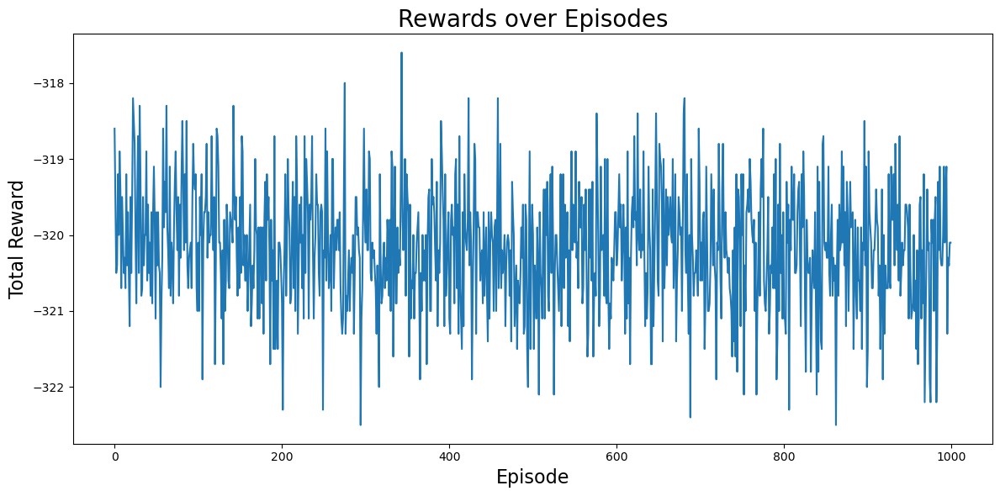

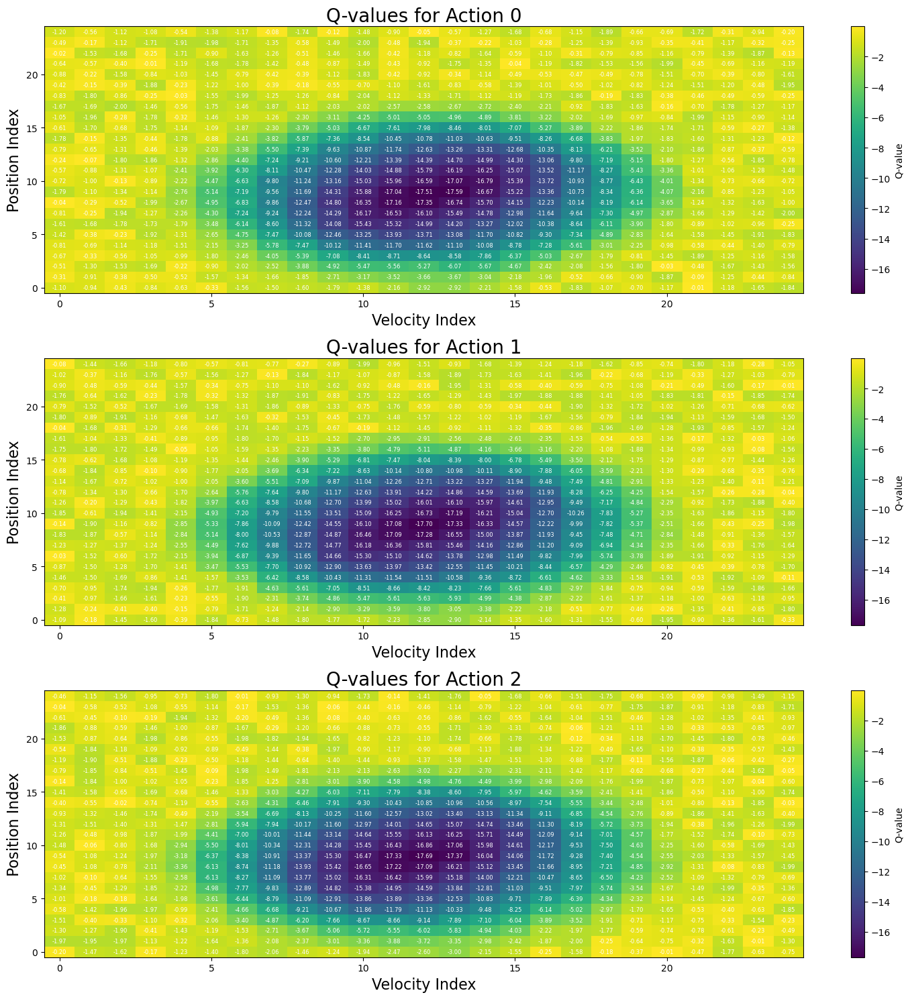

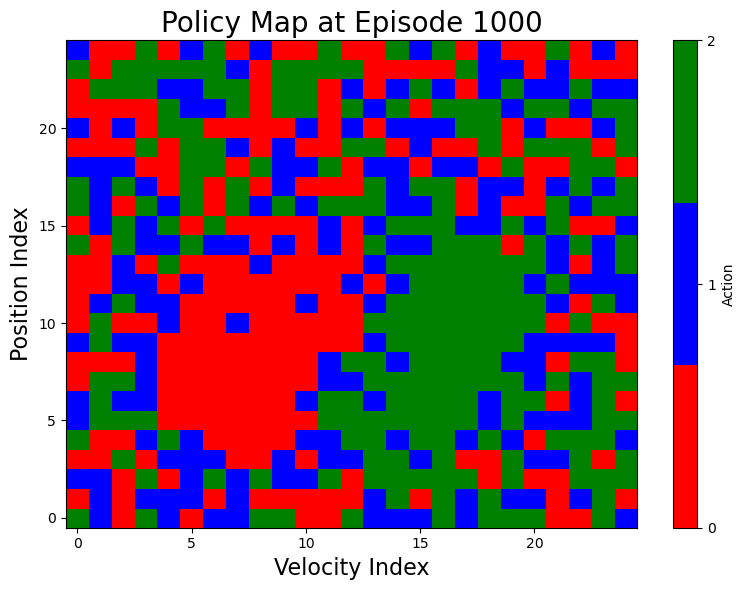

[Episode 2000] avg: -318.60, max: -116.79999999999941, min: -322.8000000000002, epsilon: 0.8333


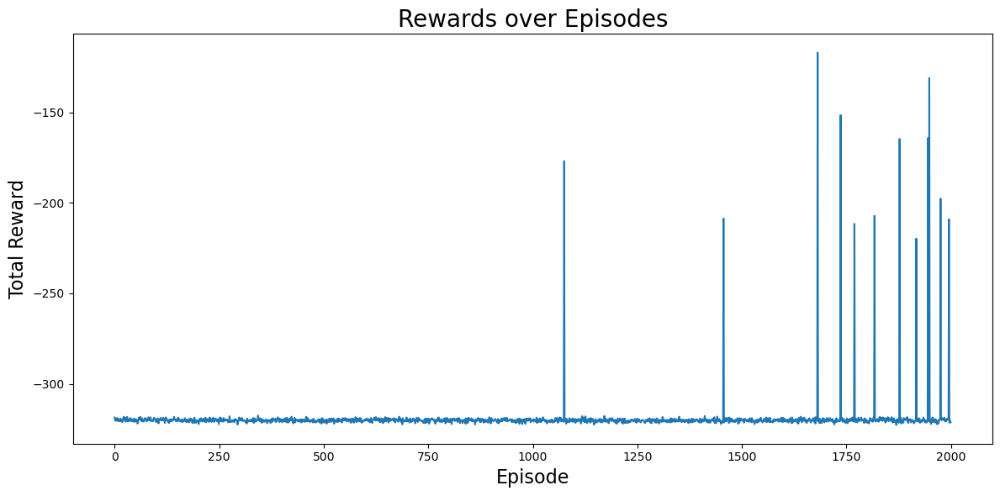

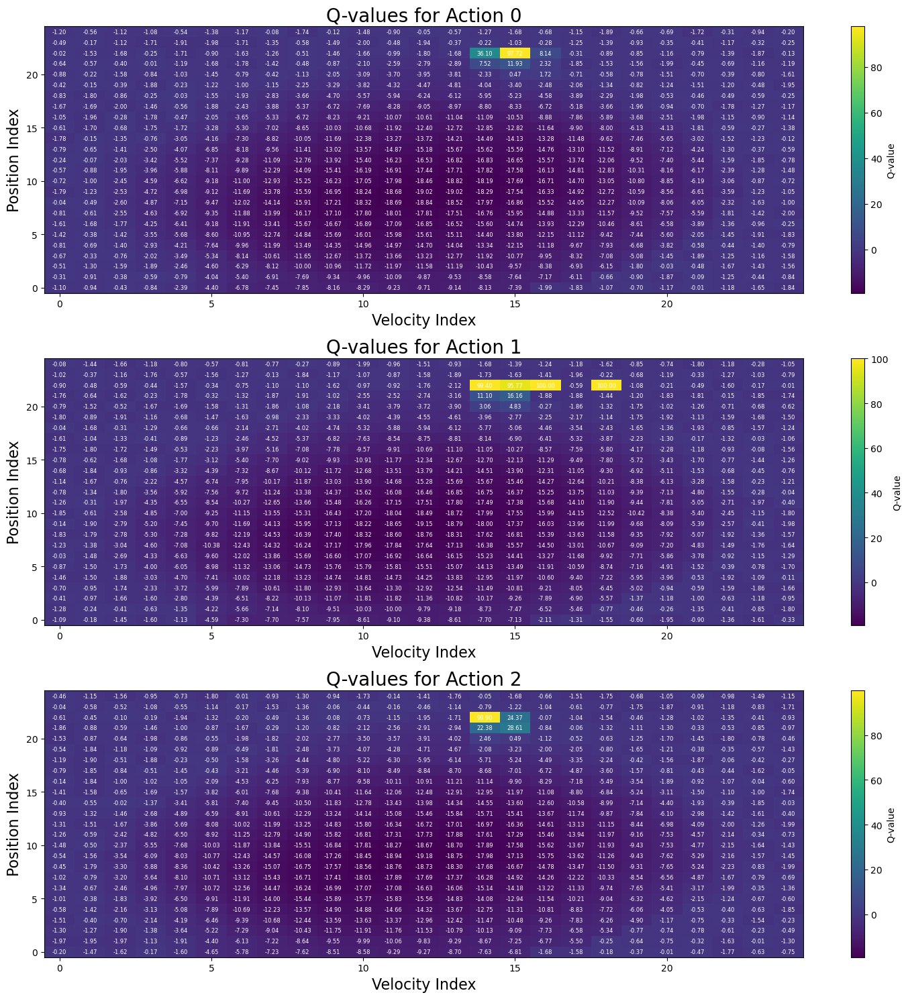

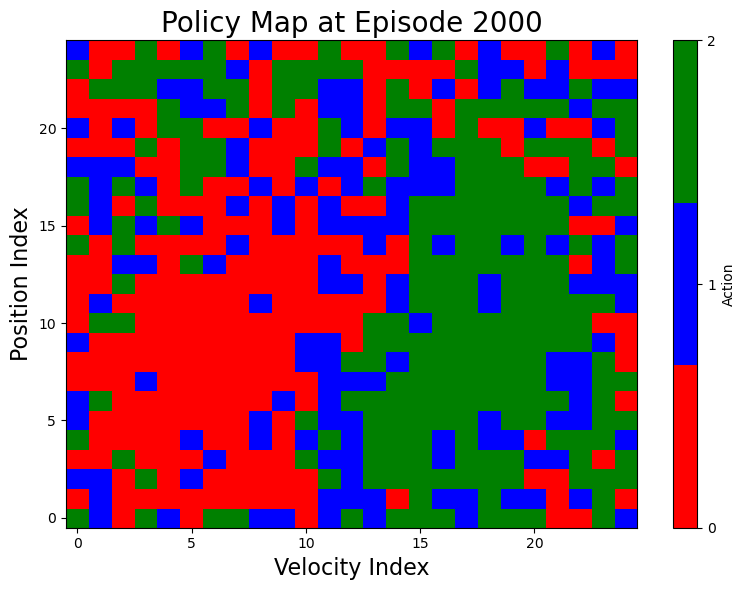

[Episode 3000] avg: -303.61, max: -66.79999999999967, min: -322.6000000000004, epsilon: 0.7500


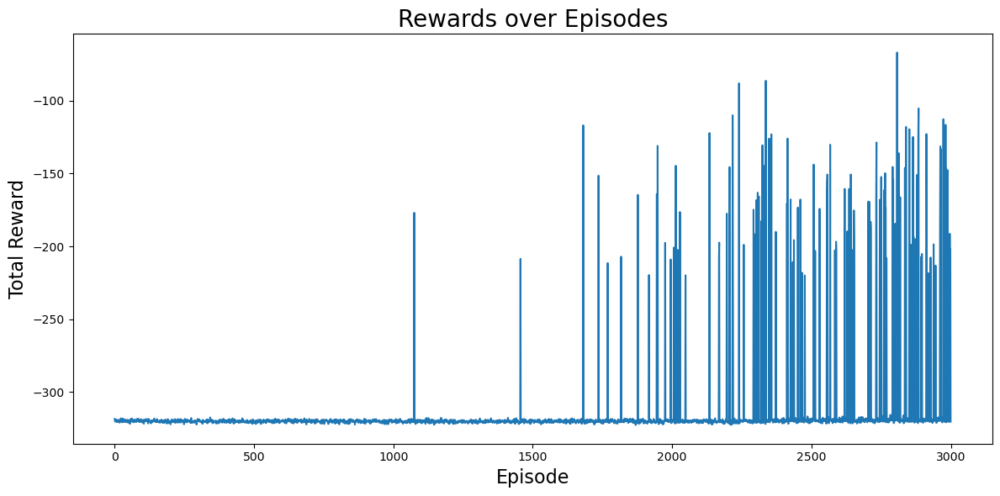

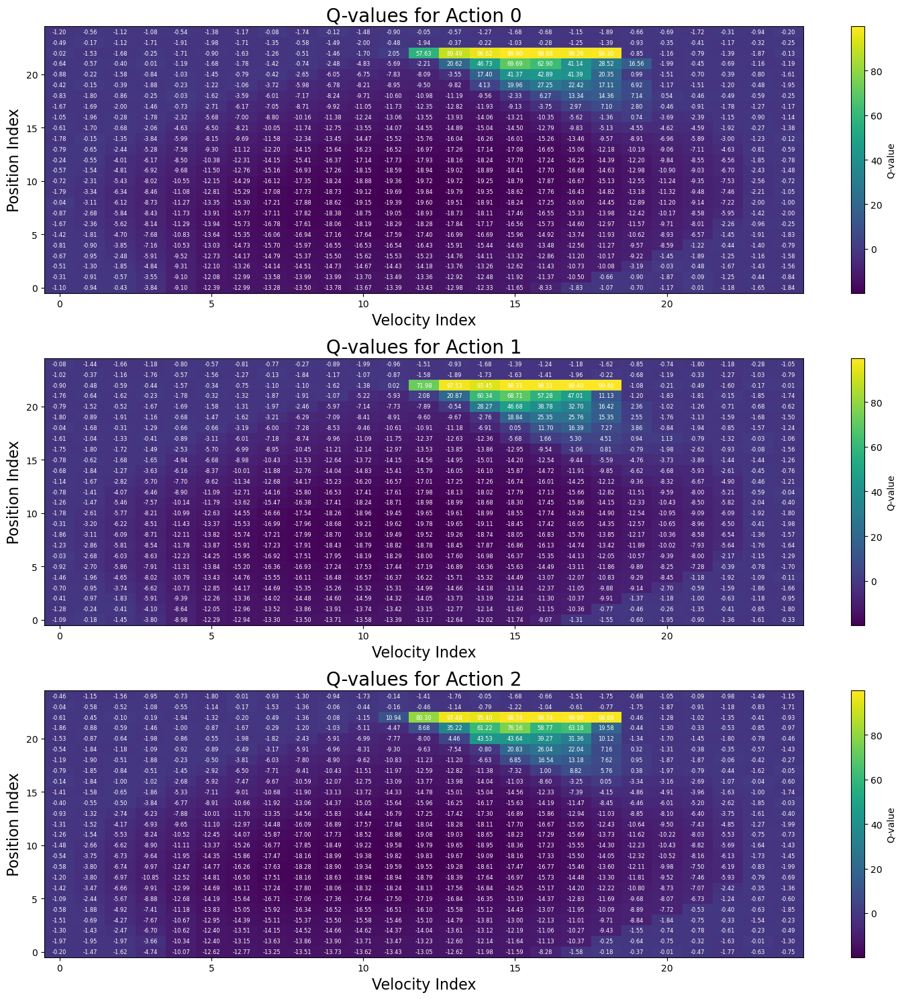

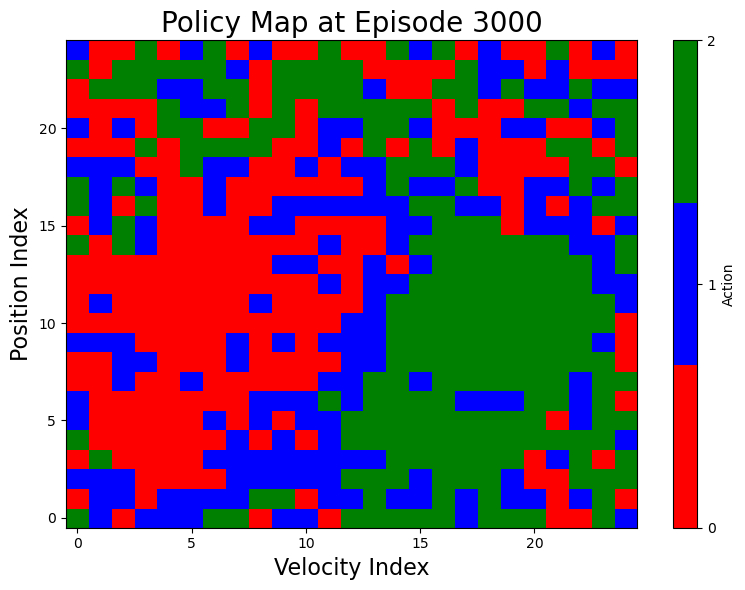

[Episode 4000] avg: -293.81, max: -71.69999999999968, min: -322.00000000000034, epsilon: 0.6667


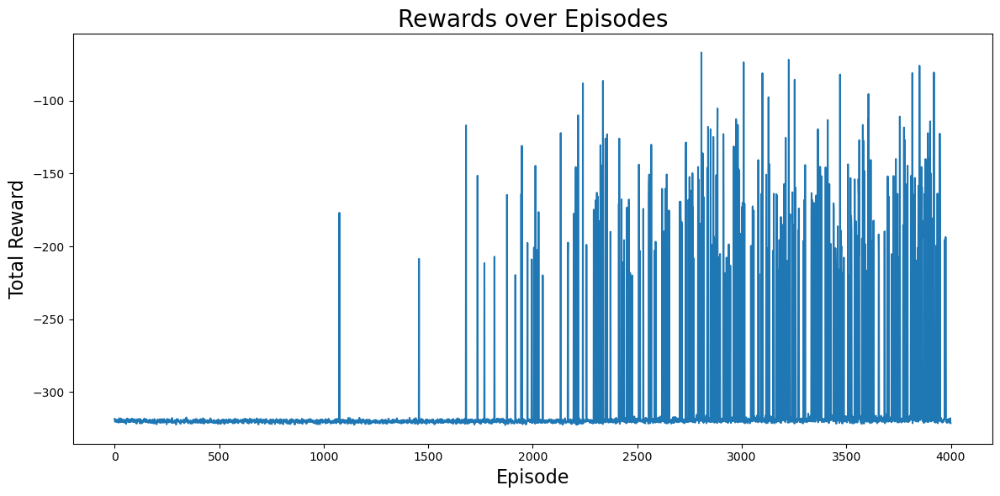

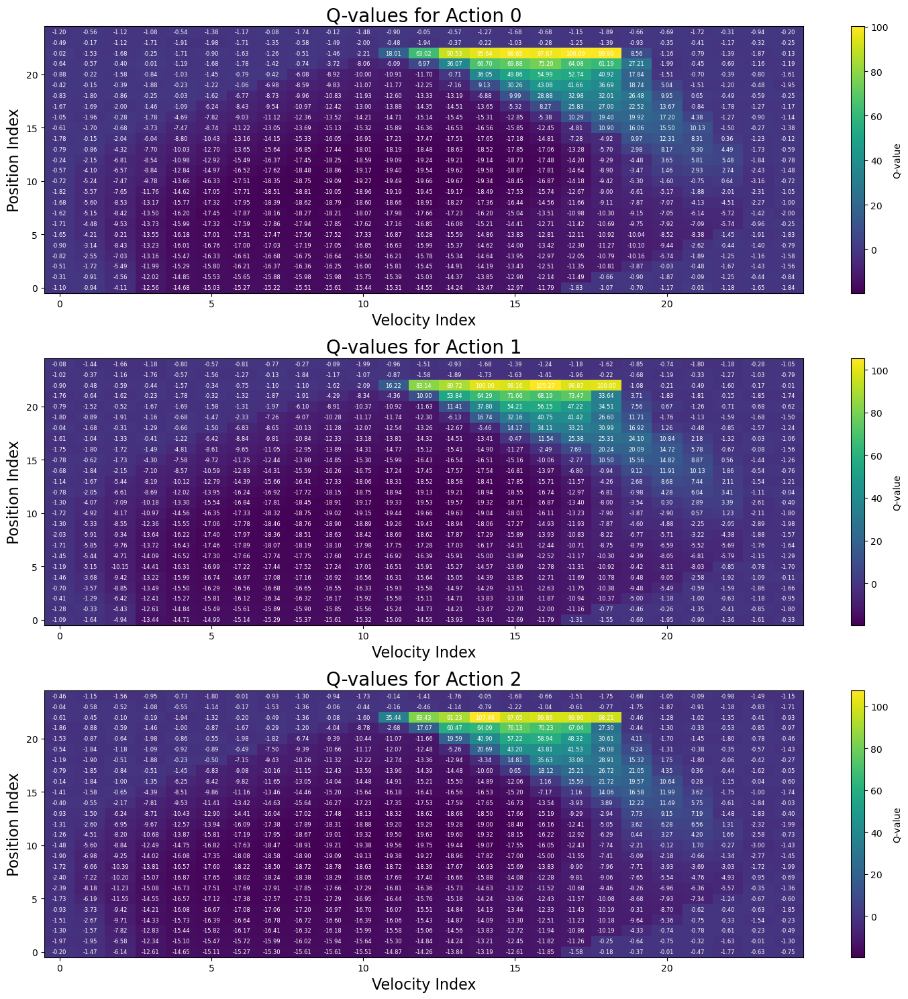

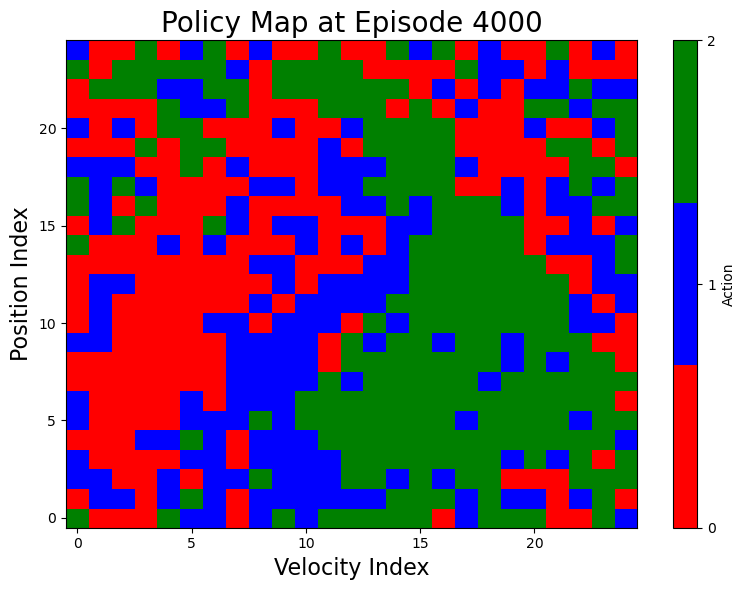

[Episode 5000] avg: -287.30, max: -35.299999999999784, min: -322.0000000000004, epsilon: 0.5833
Q-table saved to q_tables\q_table_episode_5000.npy


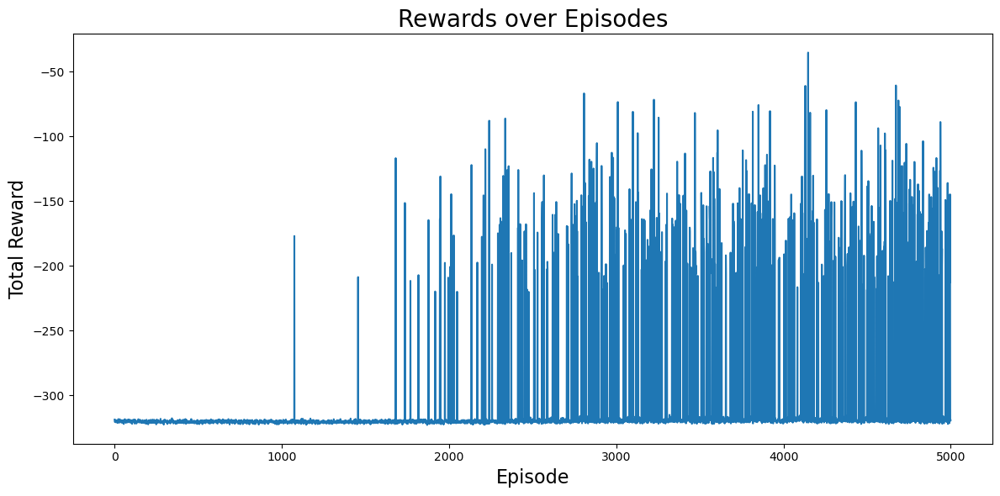

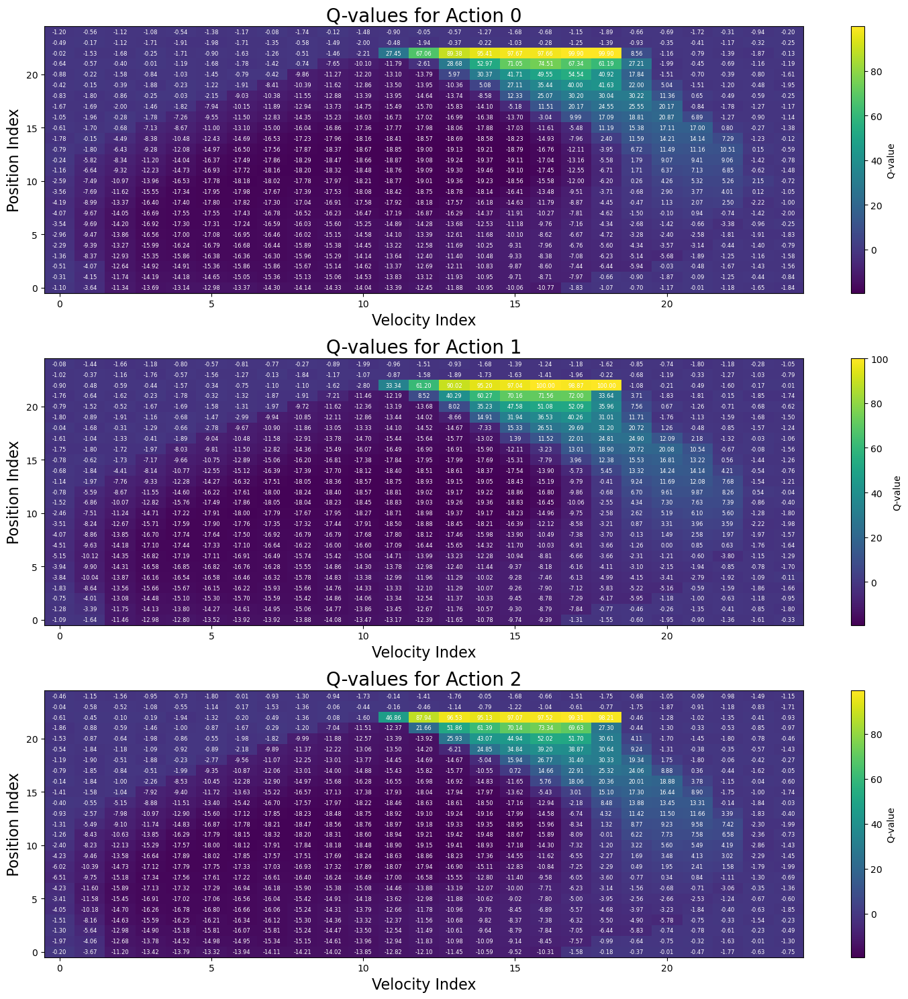

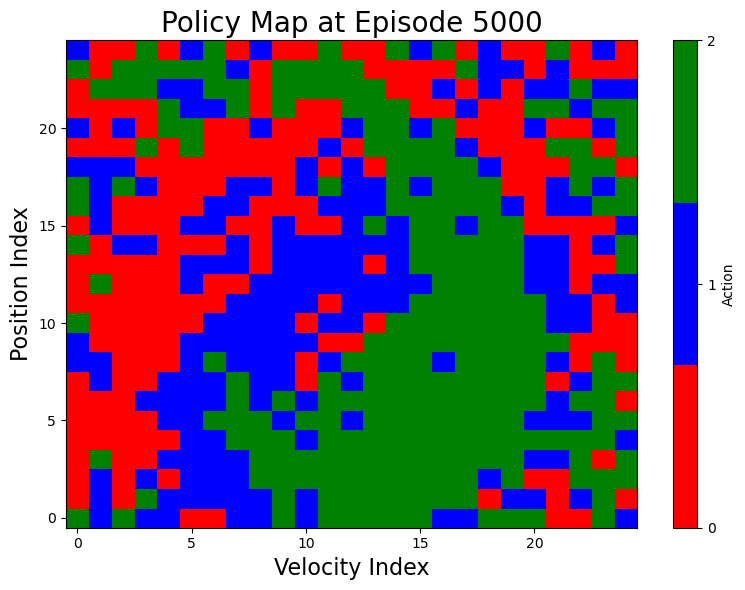

[Episode 6000] avg: -248.59, max: -53.2999999999997, min: -323.4000000000004, epsilon: 0.5000


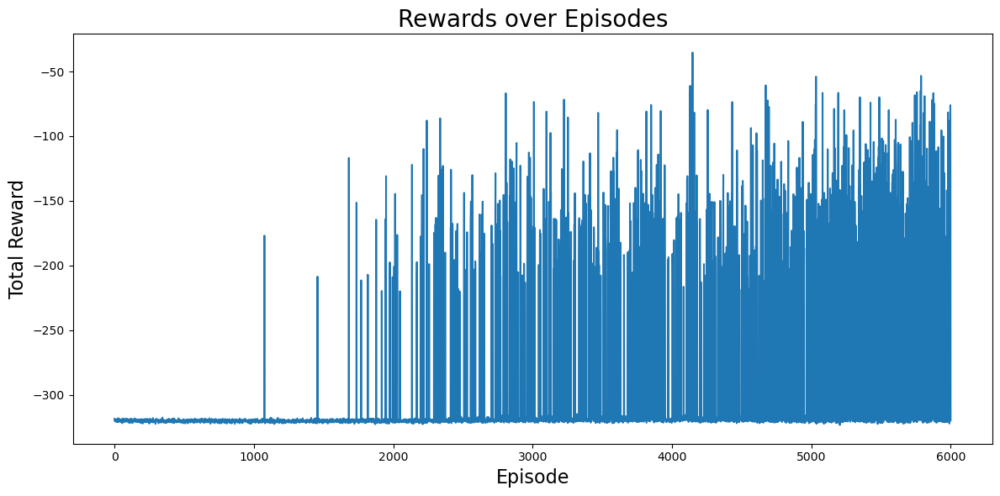

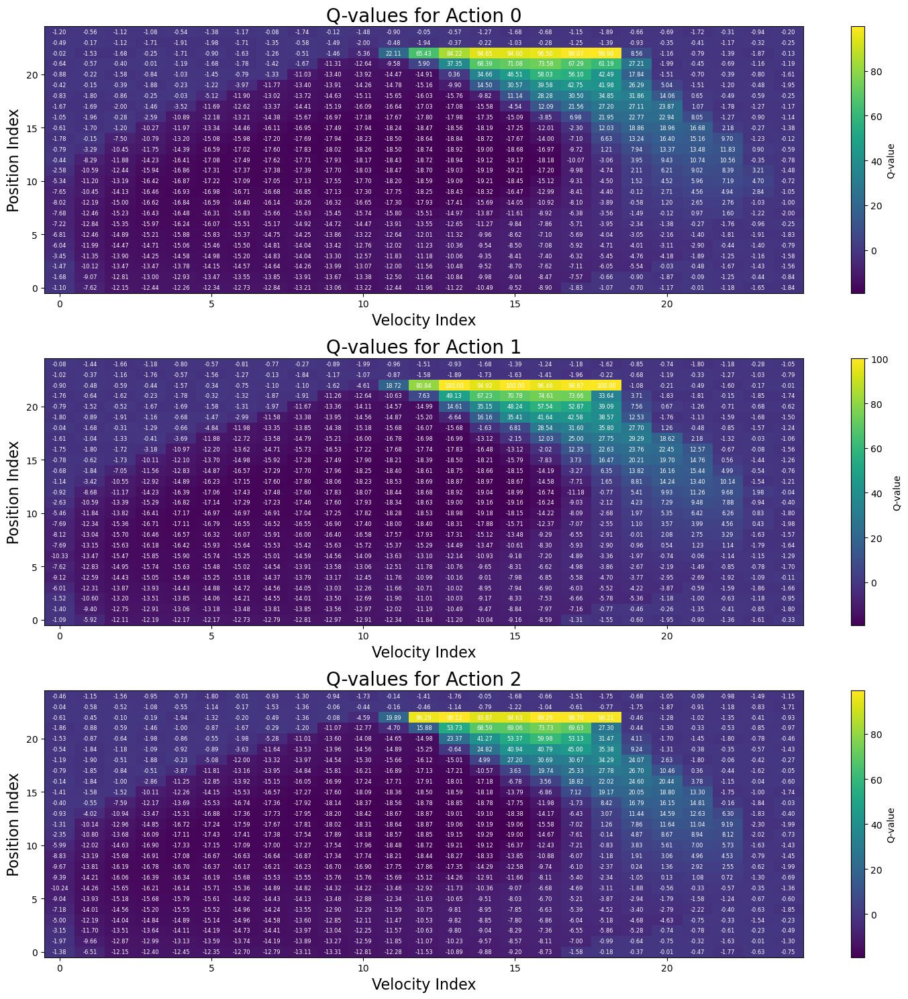

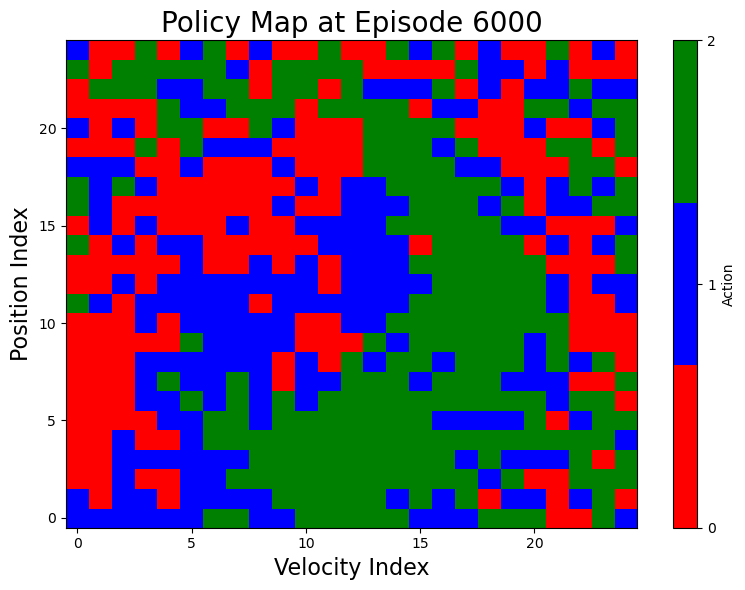

[Episode 7000] avg: -208.71, max: 0.40000000000011937, min: -322.50000000000034, epsilon: 0.4167


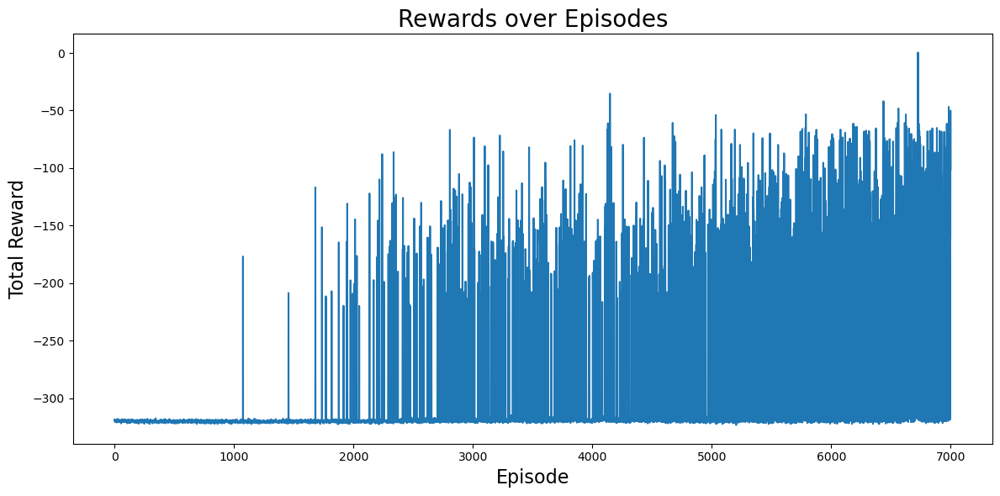

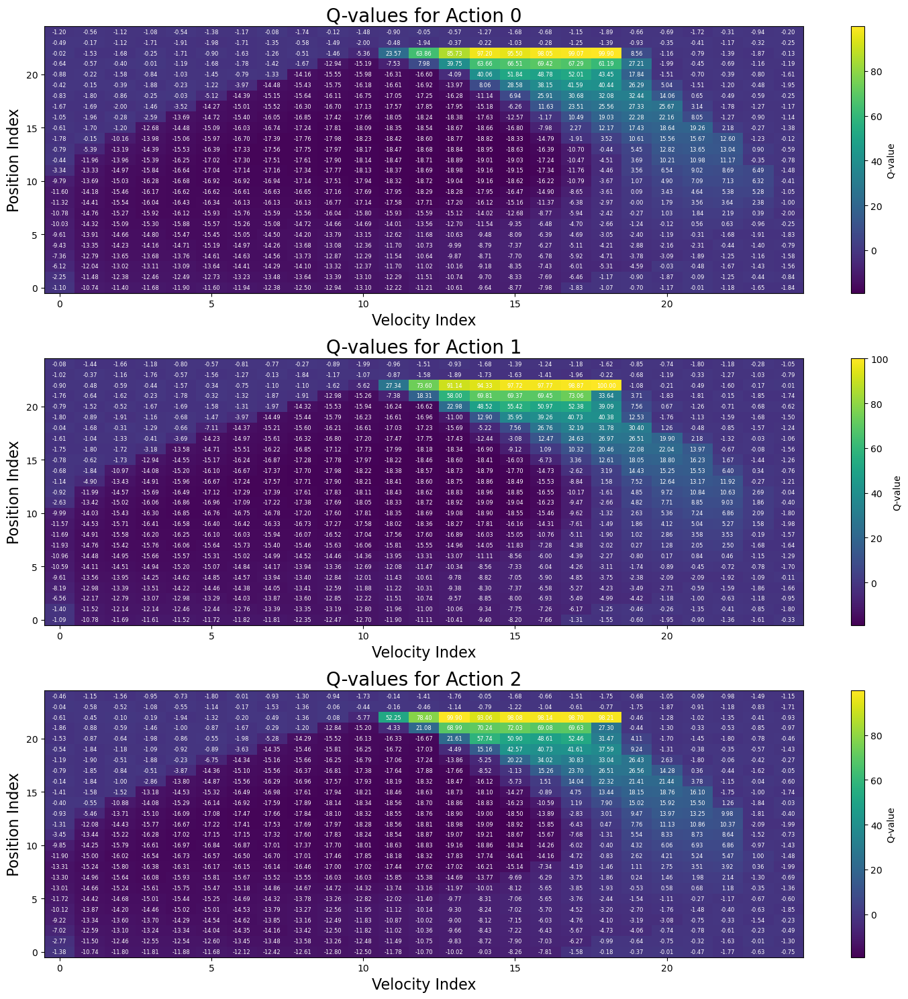

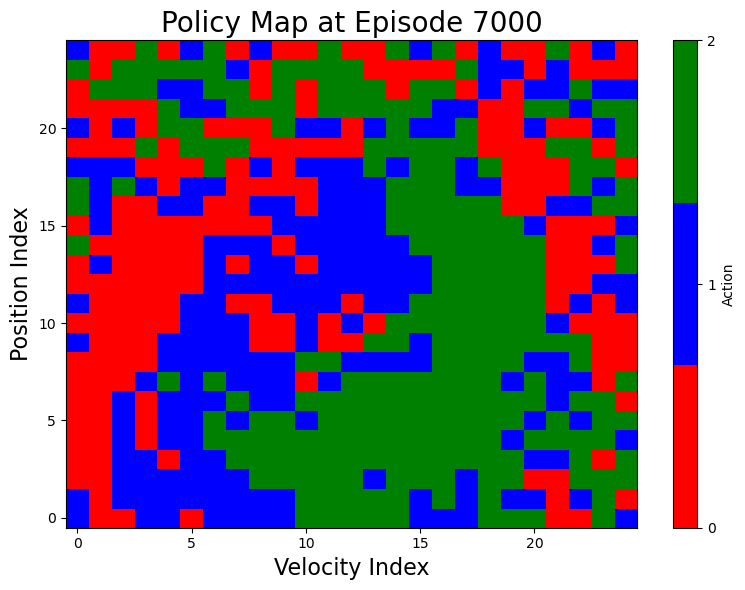

[Episode 8000] avg: -137.43, max: 16.30000000000004, min: -322.70000000000033, epsilon: 0.3333


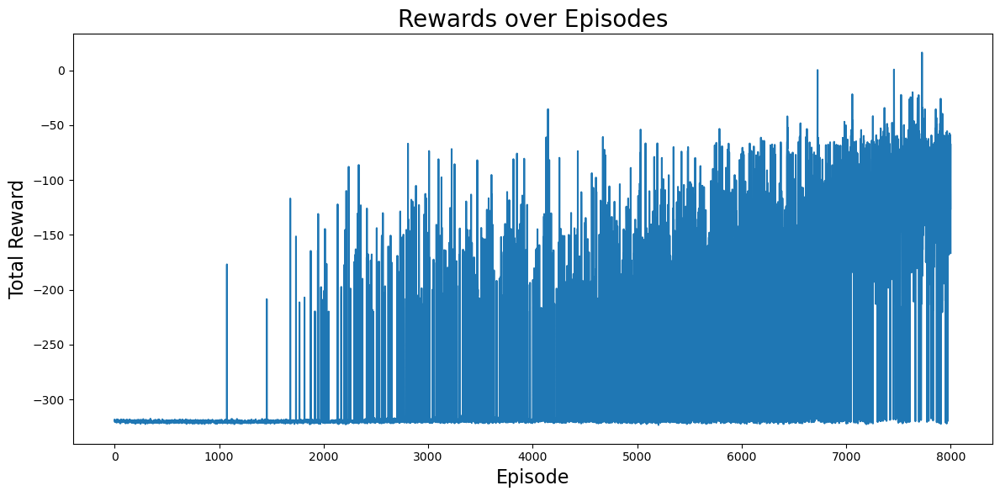

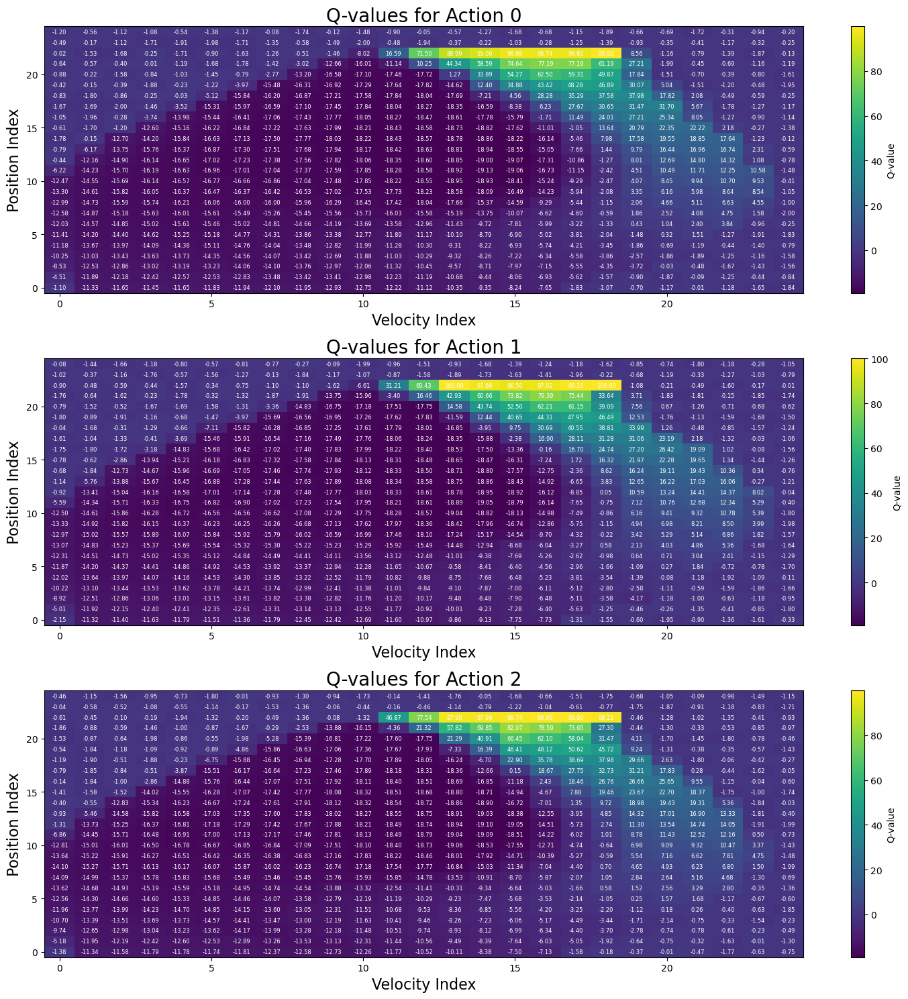

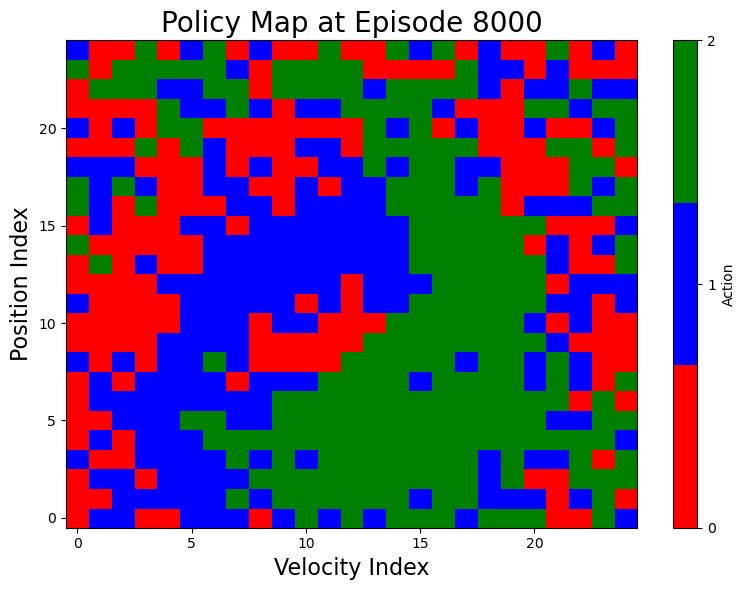

[Episode 9000] avg: -100.85, max: 12.20000000000006, min: -323.9000000000005, epsilon: 0.2500


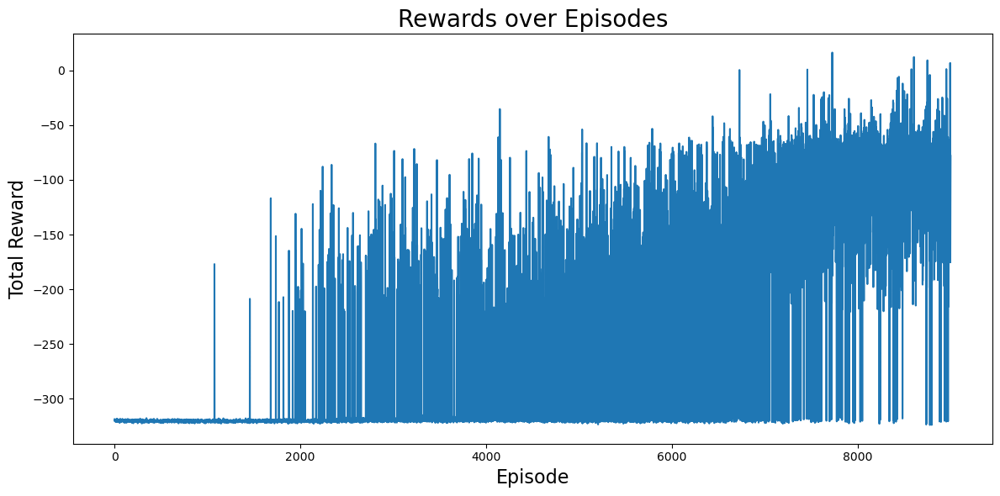

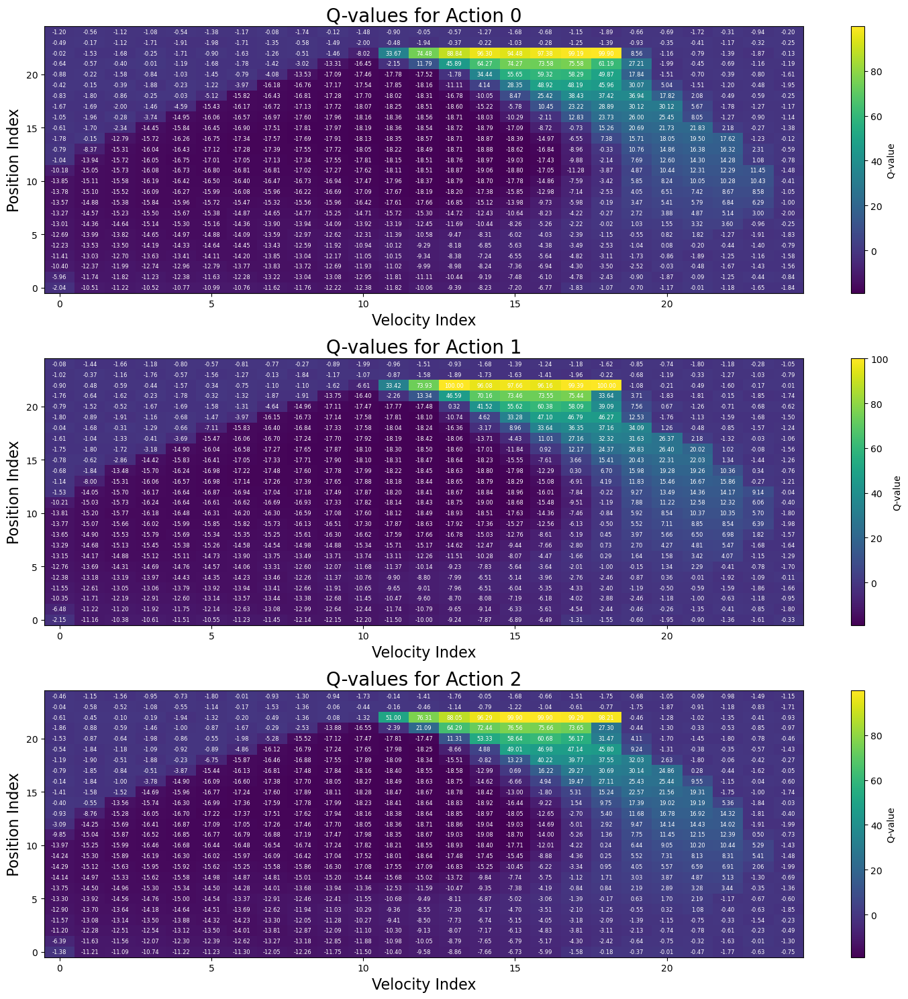

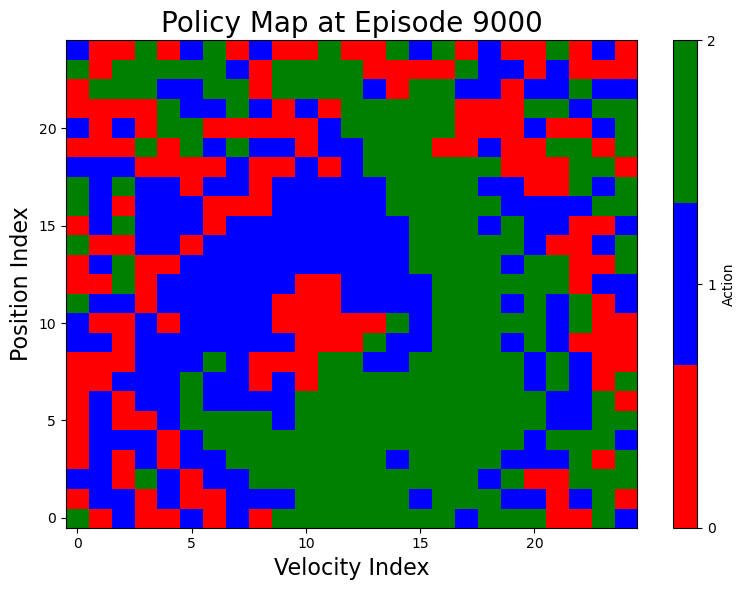

[Episode 10000] avg: -72.12, max: 23.100000000000023, min: -321.10000000000025, epsilon: 0.1667
Q-table saved to q_tables\q_table_episode_10000.npy


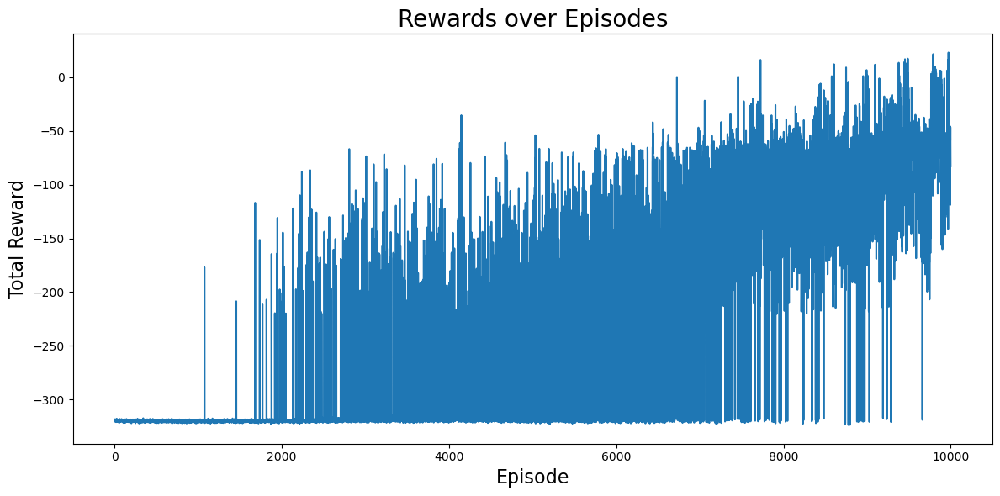

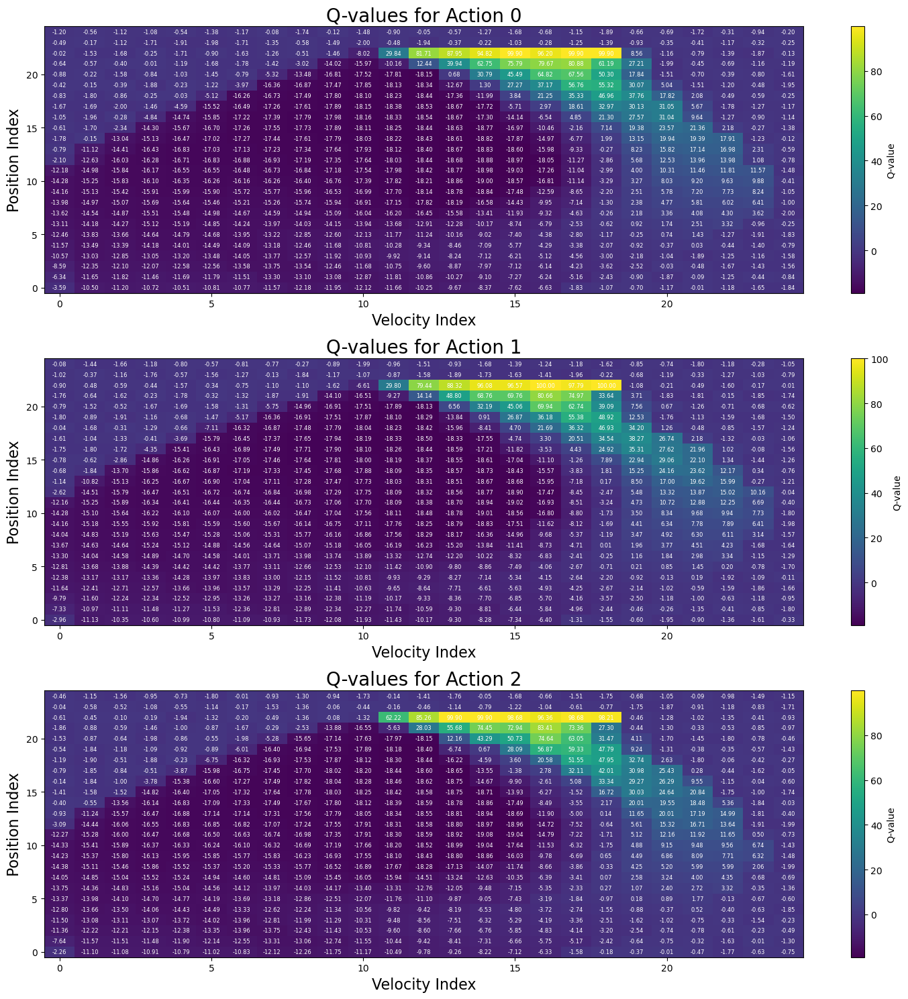

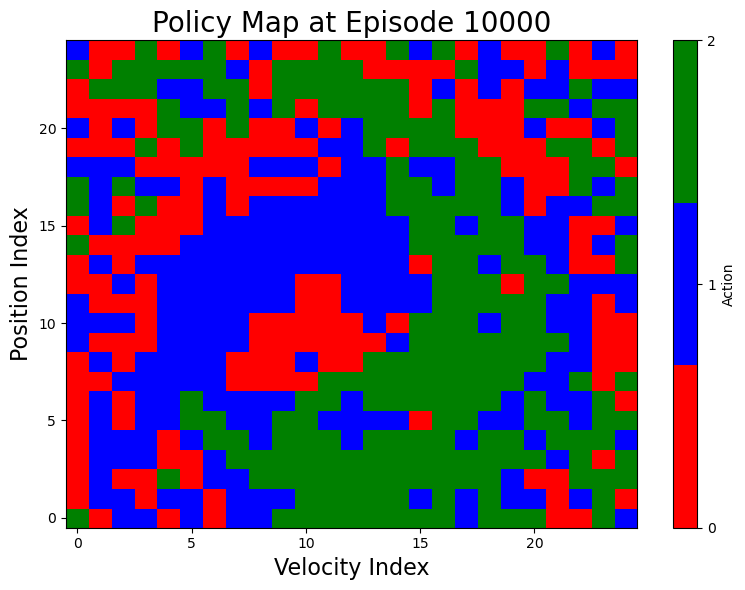

[Episode 11000] avg: -46.56, max: 25.60000000000001, min: -325.5000000000003, epsilon: 0.0833


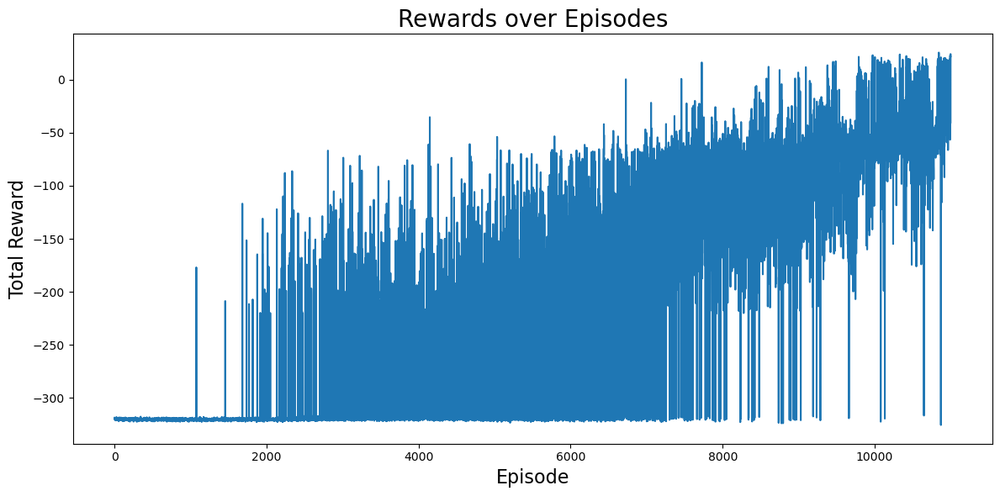

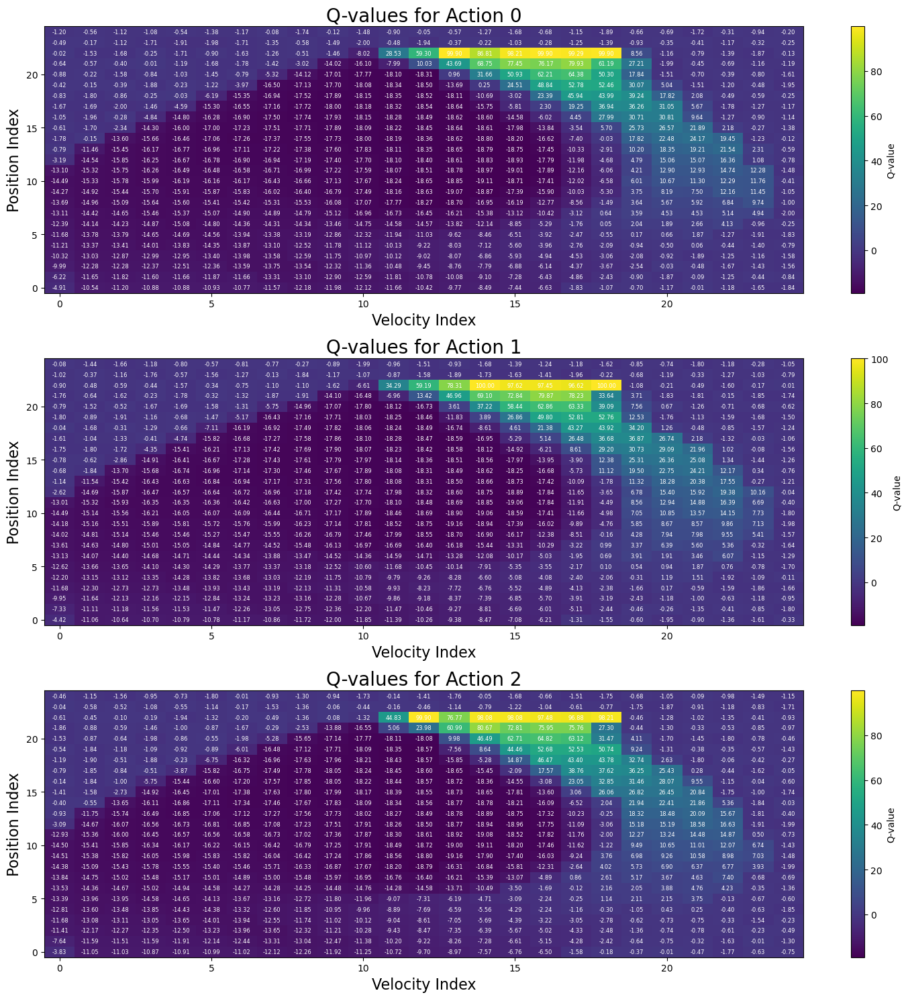

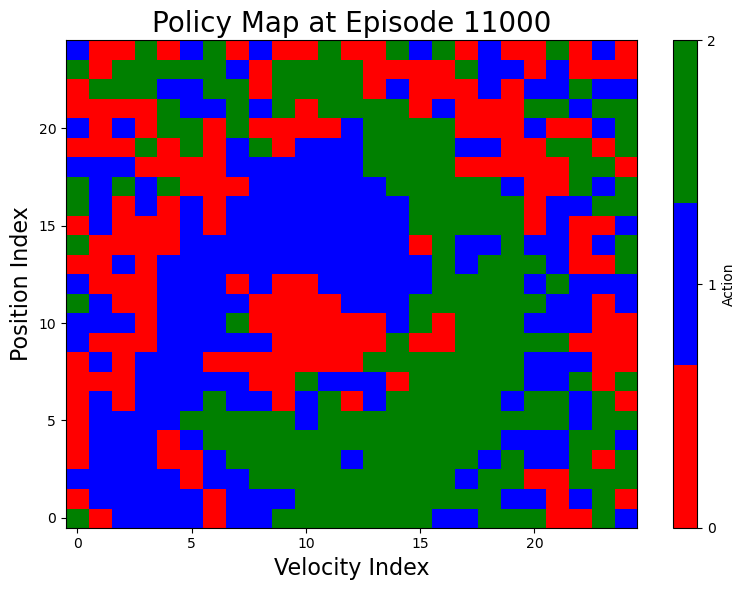

[Episode 12000] avg: -31.29, max: 21.90000000000002, min: -326.2000000000004, epsilon: 0.0000


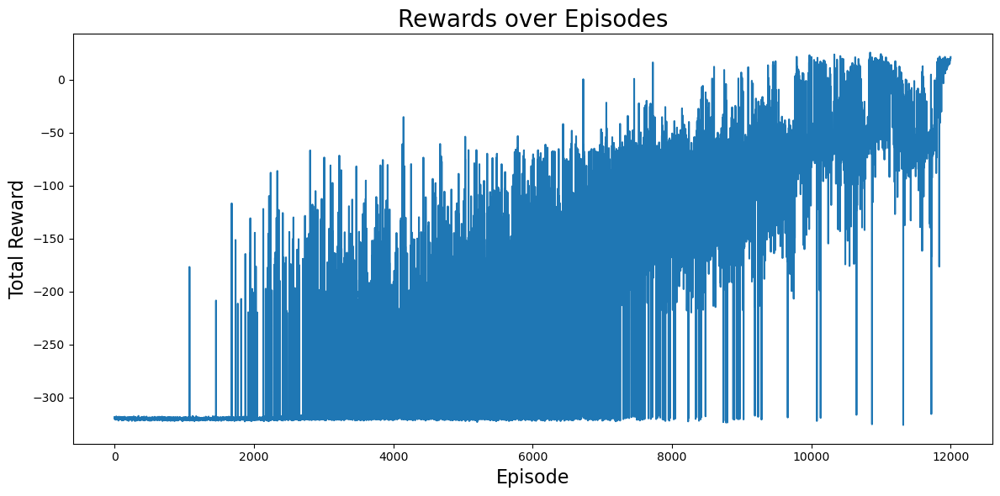

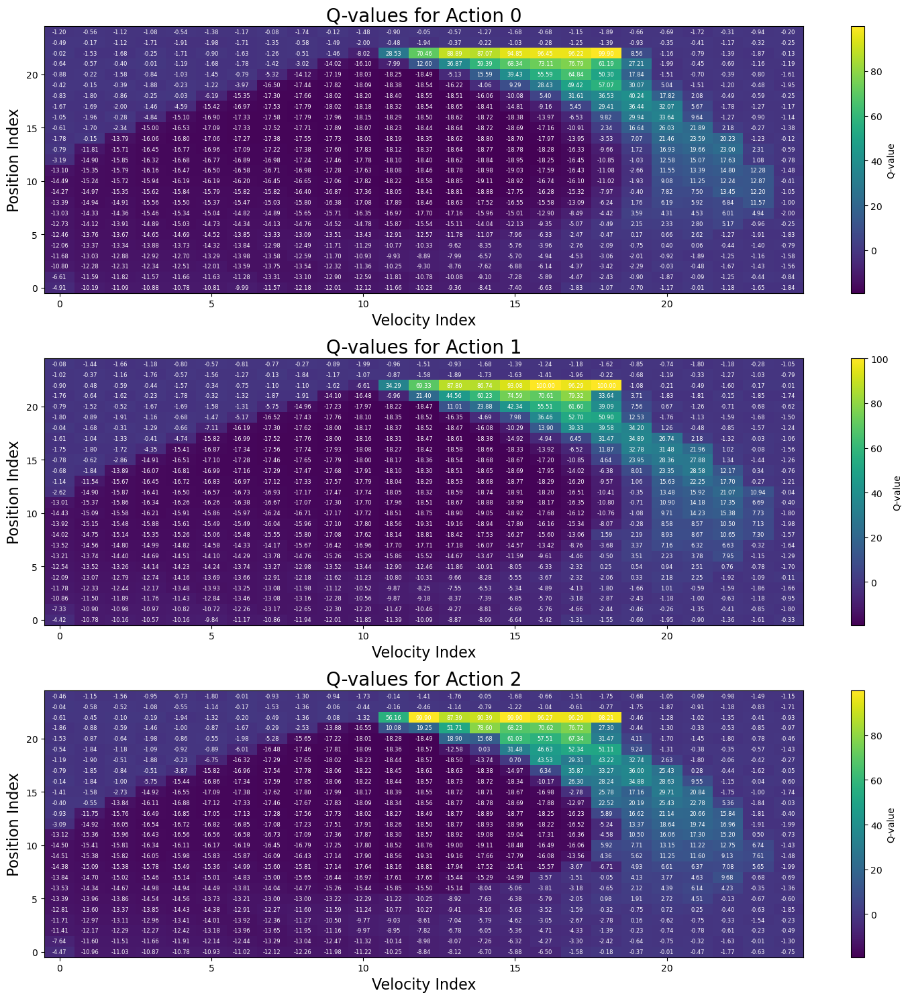

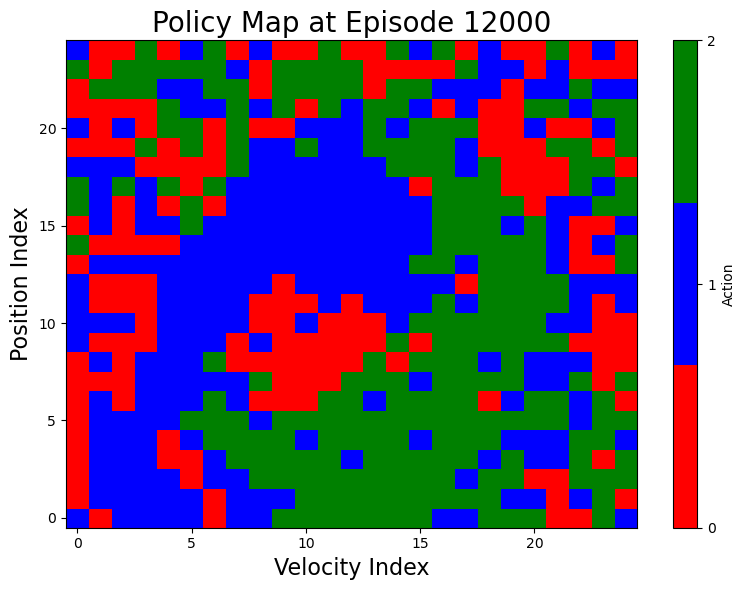

[Episode 13000] avg: 19.23, max: 22.30000000000001, min: 13.600000000000037, epsilon: 0.0000


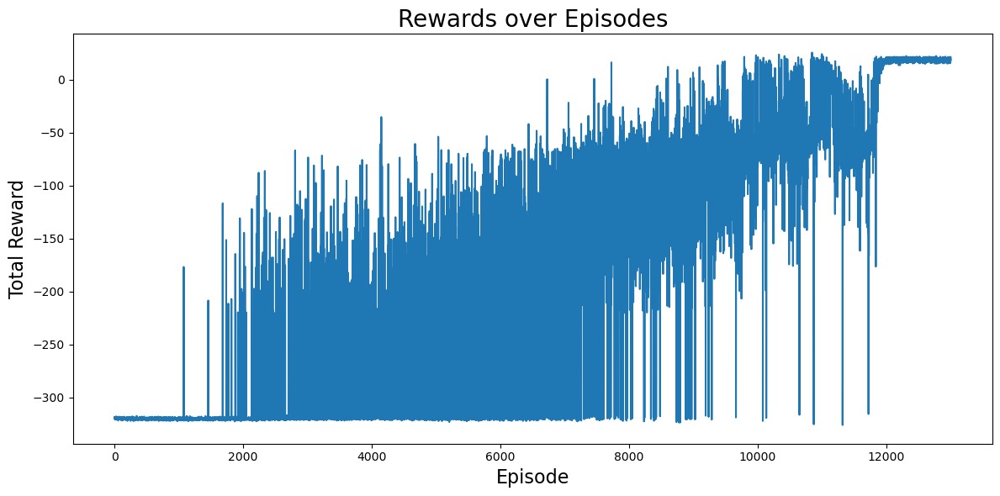

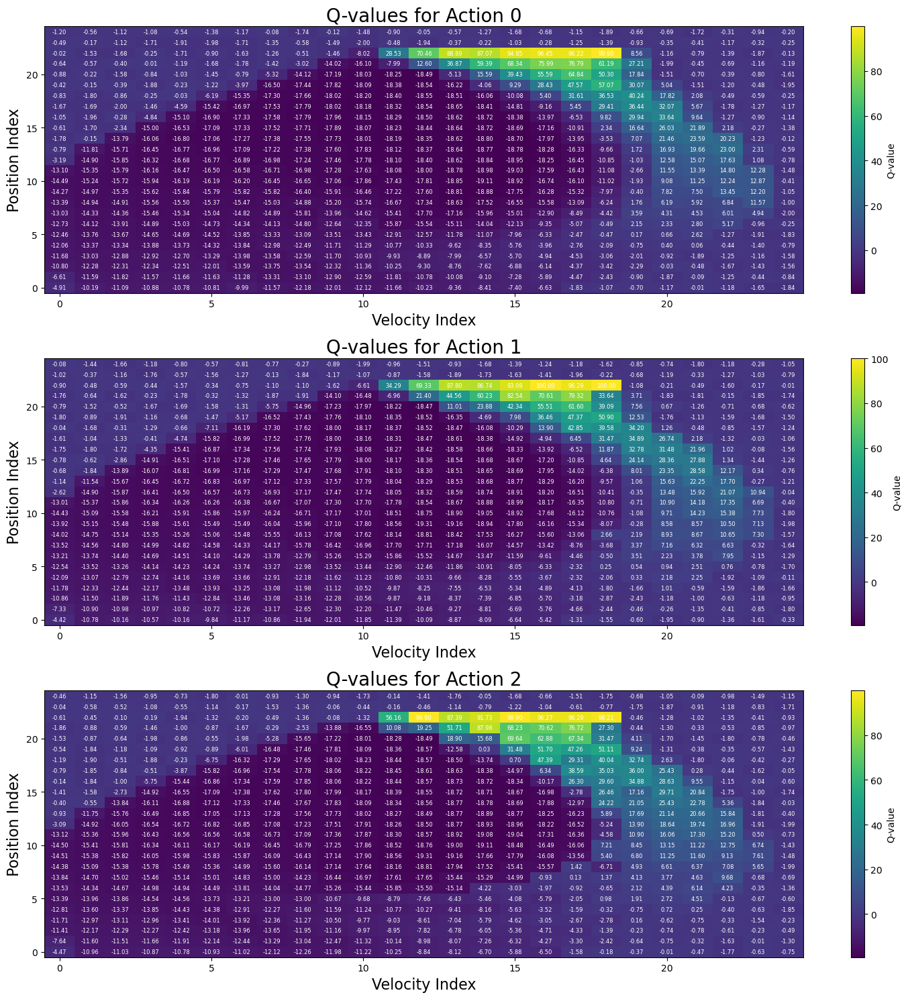

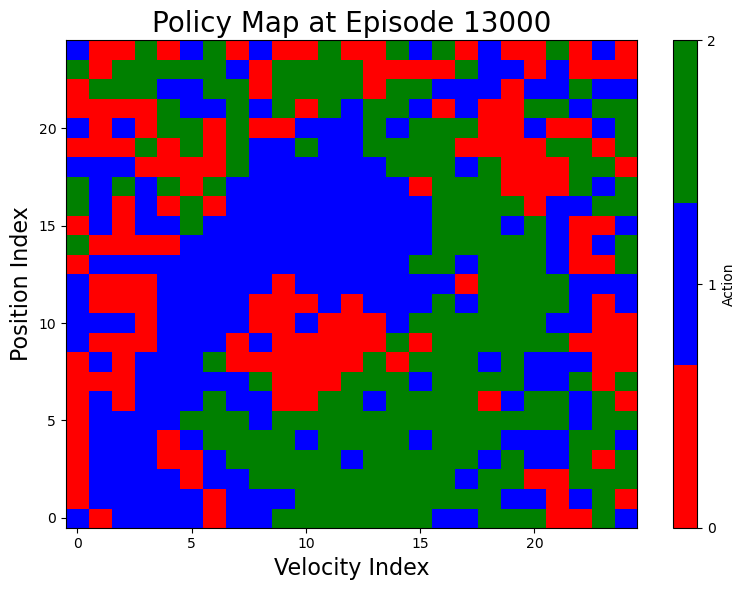

[Episode 14000] avg: 19.27, max: 22.30000000000001, min: 15.200000000000031, epsilon: 0.0000


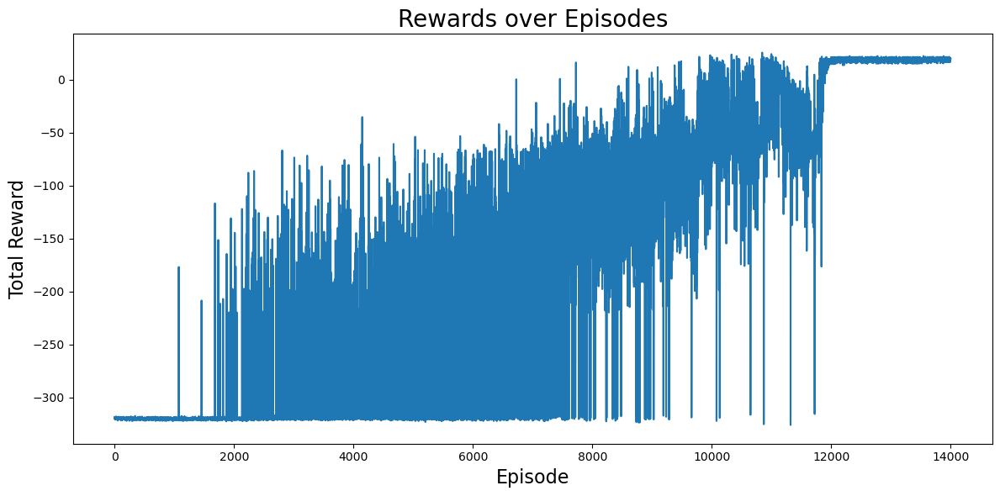

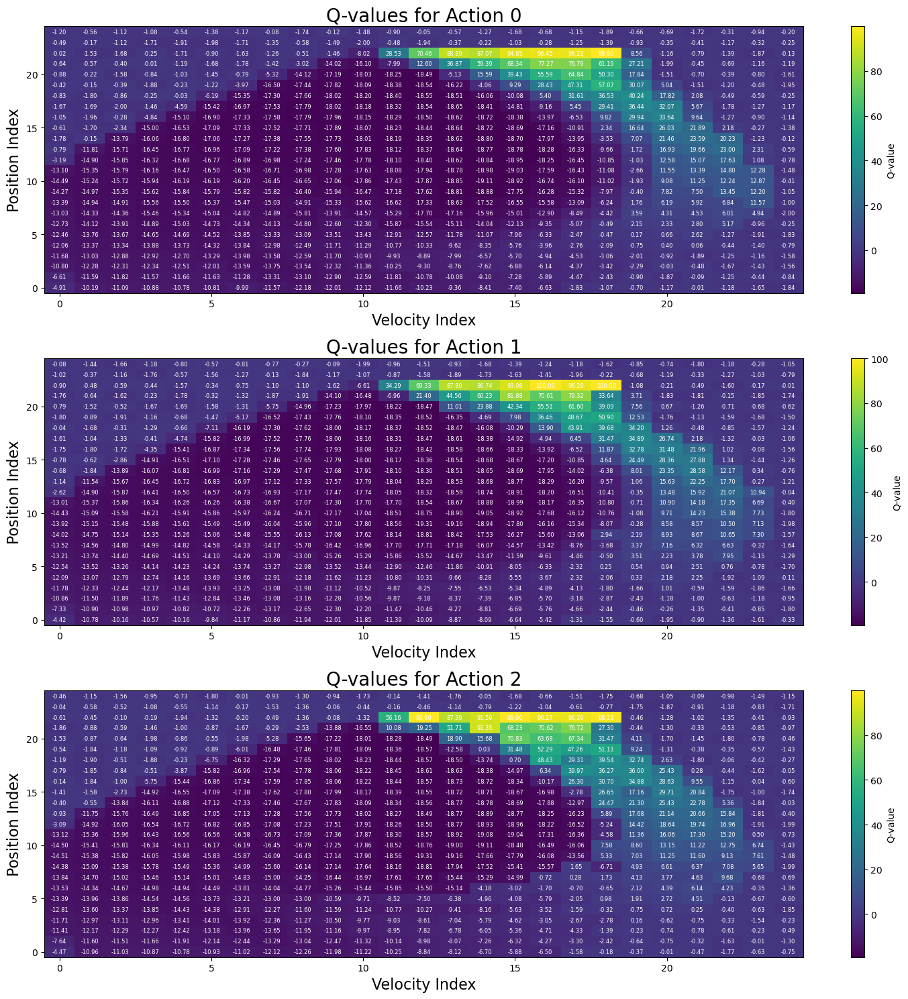

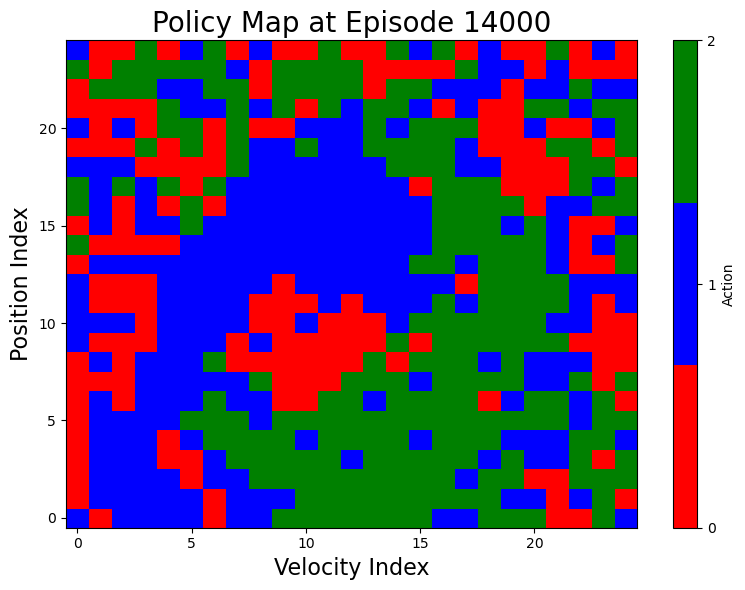

[Episode 15000] avg: 19.39, max: 22.30000000000001, min: 15.400000000000034, epsilon: 0.0000
Q-table saved to q_tables\q_table_episode_15000.npy


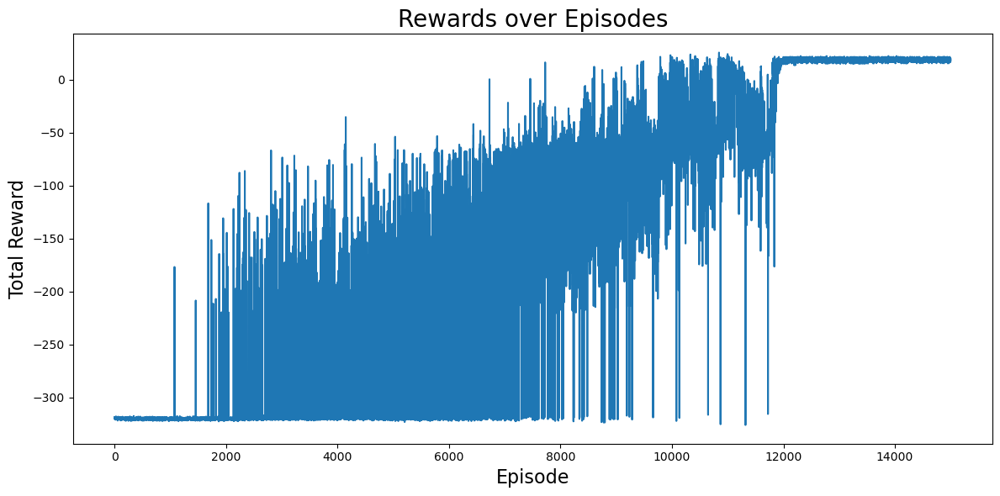

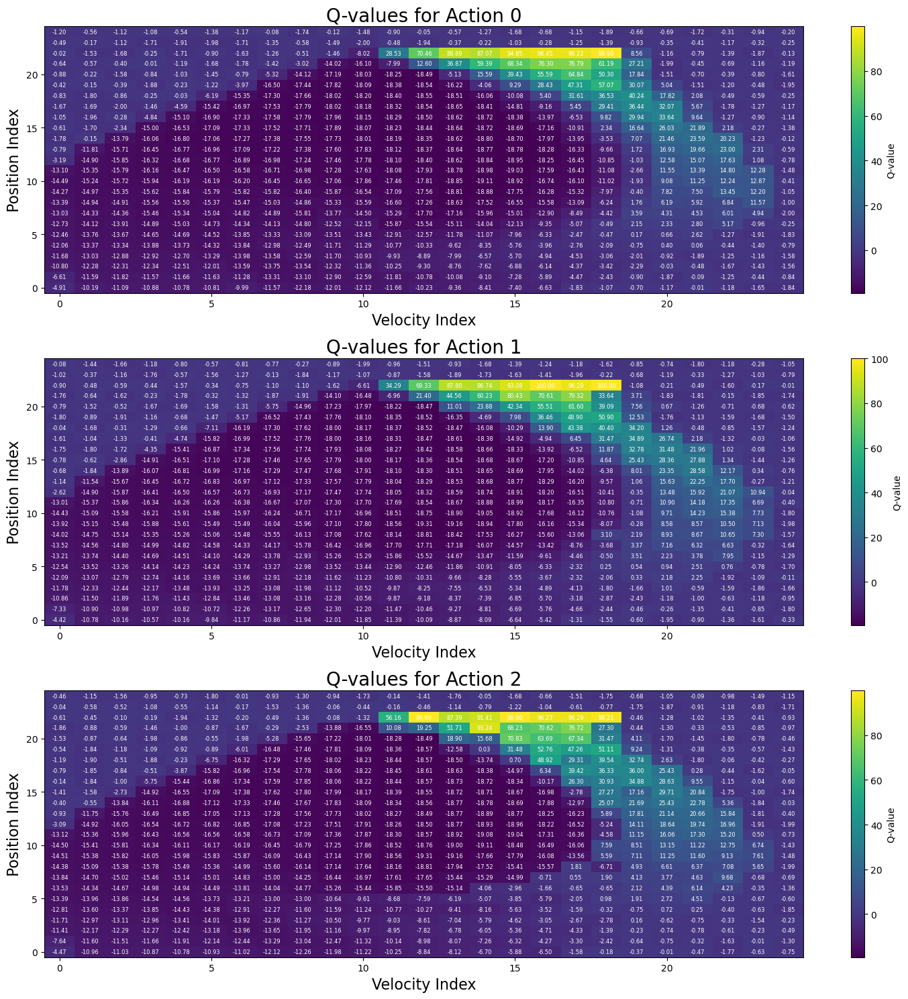

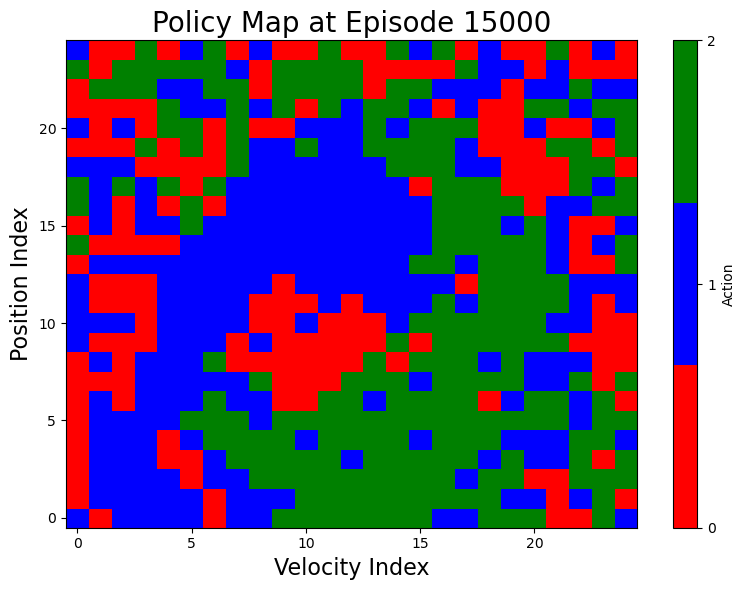

In [13]:
# Train agent
agent.train(eval_intervals=1000, save_interval=5000, plot_interval=1000)

## Evaluate the Learned Policy
Use the trained Q-table to:
- Run the agent without exploration (ε = 0)
- Confirm that it reliably solves the task
- See how efficient it is (e.g. how many steps to reach the goal)

In [20]:
agent.agent_eval()

Evaluation started (no render for custom env)
Evaluation reward: 20.50


##  Visualize the Agent's Trajectory
This lets you see how the agent moves over time — e.g. how long it takes to climb the hill.

In [21]:
def plot_agent_trajectory(agent, max_steps=1000):
    state = agent.env.reset()[0] if isinstance(agent.env.reset(), tuple) else agent.env.reset()
    positions = []
    velocities = []

    done = False
    steps = 0

    while not done and steps < max_steps:
        state_idx = agent.get_state_index(state)
        action = np.argmax(agent.q_table[state_idx])
        next_state, reward, terminated, truncated, _ = agent.env.step(action)
        
        pos, vel = state
        positions.append(pos)
        velocities.append(vel)
        
        state = next_state
        done = terminated or truncated
        steps += 1

    # Plot trajectory
    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.plot(positions)
    plt.title("Position over Time")
    plt.xlabel("Time Step")
    plt.ylabel("Position")

    plt.subplot(1, 2, 2)
    plt.plot(velocities)
    plt.title("Velocity over Time", fontsize=20)
    plt.xlabel("Time Step", fontsize=16)
    plt.ylabel("Velocity", fontsize=16)

    plt.tight_layout()
    plt.show()

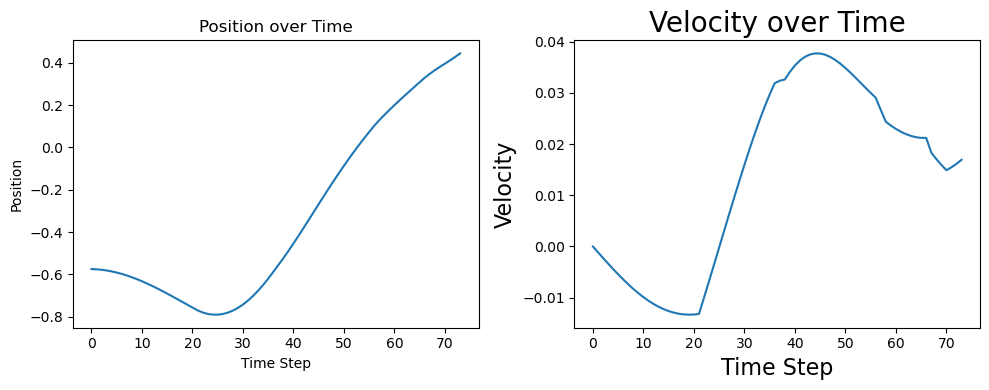

In [22]:
plot_agent_trajectory(agent, max_steps=400)

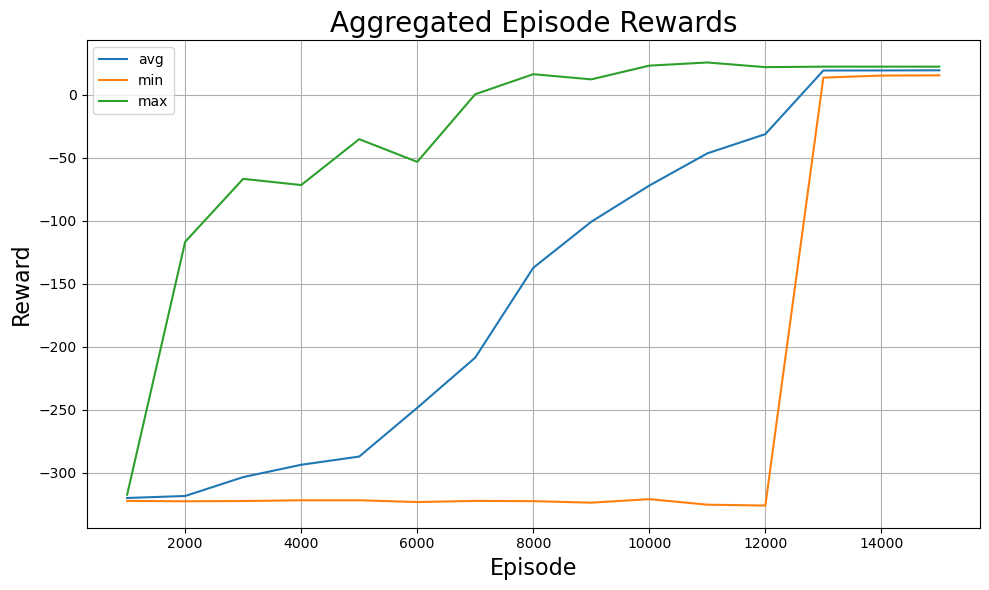

In [23]:
agent.plot_stats()

In [24]:
def plot_policy_arrows(agent):
    policy = np.argmax(agent.q_table, axis=2)

    pos_bins = np.linspace(agent.observation_space_low[0], agent.observation_space_high[0], agent.discrete_sizes[0])
    vel_bins = np.linspace(agent.observation_space_low[1], agent.observation_space_high[1], agent.discrete_sizes[1])
    X, Y = np.meshgrid(vel_bins, pos_bins)

    dx = np.zeros_like(policy, dtype=float)
    dy = np.zeros_like(policy, dtype=float)
    dx[policy == 0] = -1
    dx[policy == 2] = 1

    plt.figure(figsize=(12, 6))
    plt.quiver(X, Y, dx, dy, 
               scale=200,            # larger scale = shorter arrows
               scale_units='xy',    # arrow size relative to axis units
               width=0.004,
              pivot='middle')         # optional: narrower arrows
    plt.title("Learned Policy (Actions)", fontsize=20)
    plt.xlabel("Velocity", fontsize=16)
    plt.ylabel("Position", fontsize=16)
    plt.xlim(-0.075, 0.075)
    plt.ylim(-1.3, 0.7)
    plt.xticks(vel_bins, rotation=90, fontsize=6)
    plt.yticks(pos_bins, fontsize=6)
    plt.tight_layout()
    plt.show()


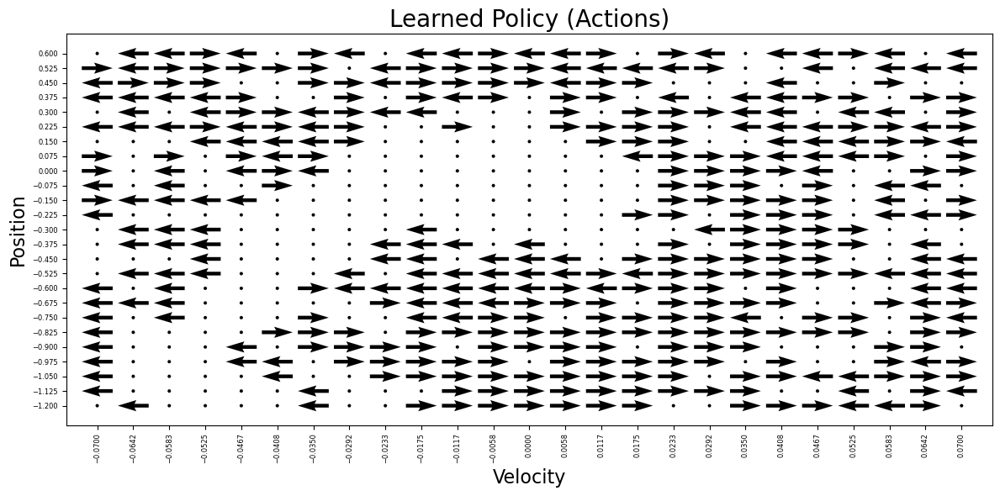

In [25]:
plot_policy_arrows(agent)

In [43]:
def plot_state_value_function(agent, annotate=True):
    value_function = np.max(agent.q_table, axis=2)

    plt.figure(figsize=(12, 6))
    im = plt.imshow(value_function, origin='lower', aspect='auto', cmap='viridis')

    plt.title("State Value Function (Max Q)", fontsize=20)
    plt.xlabel("Velocity", fontsize=16)
    plt.ylabel("Position", fontsize=16)
    plt.colorbar(im, label="Value")

    if annotate:
        for i in range(value_function.shape[0]):
            for j in range(value_function.shape[1]):
                val = f"{value_function[i, j]:.2f}"
                plt.text(j, i, val, ha='center', va='center', fontsize=5, color='white')

    plt.xticks(
        ticks=np.linspace(0, agent.discrete_sizes[1] - 1, 5),
        labels=np.round(np.linspace(agent.observation_space_low[1], agent.observation_space_high[1], 5), 2)
    )
    plt.yticks(
        ticks=np.linspace(0, agent.discrete_sizes[0] - 1, 5),
        labels=np.round(np.linspace(agent.observation_space_low[0], agent.observation_space_high[0], 5), 2)
    )

    plt.tight_layout()
    plt.show()

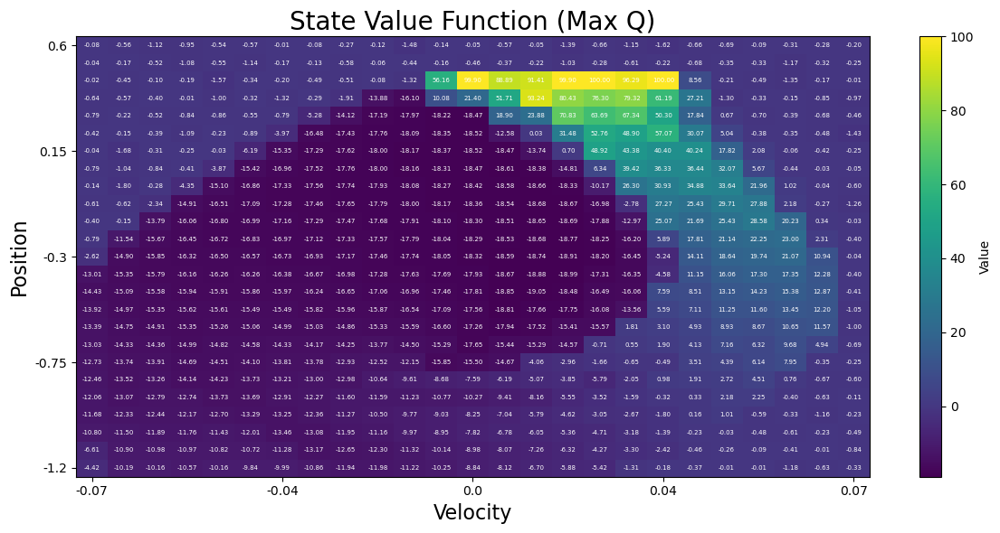

In [44]:
plot_state_value_function(agent)

# APPENDIX

## Q-Value learning

Last time we showed methods for _evaluating_ $V_{\pi} (s) $. 
Today we will recycle most of the ideas from the past excercise for the application of _model-free control_, i.e. to find the optimal policy given only the experience of an environment. Again, the experience consists in the trajectories we perform as we explore the environment:

$\tau_i = (S^i_0, A^i_0, R^i_1, S^i_1, A^i_1, R^i_1, \dots S^i_{T^i})$


To do this, it will be more convenient to consider, instead of the _state_-function $V_{\pi} (s) $, the _state/action_-function $Q_{\pi}(s,a)$. It is defined as:

### Definition 1.

$$
Q_{\pi}(s,a) = \mathbb{E}_\pi\bigg[ \sum_{t=0}^\infty \gamma^t \, R_{t+1} \, \, \Big| \, \, S_0 = s, A_0 = a \bigg] \ .
$$

_"The expectation discounted cumulative sum of all future rewards when starting from state $s$, acting with action $a$ and then always following the policy $\pi$"_

or equivalently as:

### Formulation 2.

$$
Q_\pi(s,a) = \mathbb{E}_{\pi}\bigg[ R_1 + \gamma V_\pi(S_1) \,\, \Big| \,\, S_0 = s, A_0 = a\bigg] \ .
$$

_"The expectation value of the immediate reward plus the discounted $V$-value of the following state $S_1$, when starting from state $s$, acting with action $a$ and then always following the policy $\pi$."_

or again as:

### Formulation 3.

$$
Q_\pi(s,a) = \mathbb{E}_{\pi}\bigg[ R_1 + \gamma  \, \sum_{a'} \, Q_\pi(S_1, a') \, \pi(a' | S_1) \,\, \Big| \,\, S_0 = s, A_0 = a\bigg] \ .
$$
_"The expectation value of the immediate reward plus the discounted $Q$-value of the following state $S_1$ and all possible actions $a'$ weighted by the probability of taking that action ($\pi(a' | S_1)$), when starting from state $s$, acting with action $a$ and then always following the policy $\pi$."_



##  Q-Learning: off-policy TD Control

Q-Learning is a very straightforward method.
As a policy to explore, we will use an $\epsilon$-greedy function:

$$
    \pi_t^{\epsilon}(s) = \left\{
    \begin{array}{cll}
        & \text{argmax}_a Q_t(s, a)   & \text{if} \,\,\,\, w.p. 1-\epsilon\\[2ex]
        & \text{any}\,\,\, a   & \text{if} \,\,\,\, w.p. \epsilon \\[2ex]
    \end{array}
    \right.
$$

At every step $t$, we will store the new reward $R_{t+1}$ and the new state $S_{t+1}$ and calculated the update almost as in SARSA. The difference in TD Control is that instead of using the action $A_{t+1}$ which we really took, we evaluate the update using the **best (known) Q-value available in $S_{t+1}$**, as if we were following a greedy path:

$$
\delta Q = R_{t+1} + \gamma \,\, \max_a Q_t(S_{t+1}, a) - Q_t(S_{t}, A_t)
$$